# Install some libs

In [1]:
!pip install -q --upgrade pip
!pip install -q ultralytics
!pip install -q supervision
!pip install -q --upgrade ultralytics>=9.0.4
!pip install -q -U git+https://github.com/Deci-AI/super-gradients.git
!pip install -q ensemble_boxes
!pip install -q timm

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


# Import some libs

In [2]:
import os
import cv2
import warnings
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import supervision as sv
import torch
import gc
import json
import psutil
import contextlib
import ultralytics

from PIL import Image
from functools import wraps
from pathlib import Path
from dataclasses import dataclass, field
from ultralytics import YOLO, YOLOWorld, YOLOE, NAS, RTDETR, SAM
from ultralytics.utils.metrics import ConfusionMatrix
from tqdm import tqdm
from matplotlib.lines import Line2D
from IPython.display import Image, display
from ensemble_boxes import weighted_boxes_fusion
from transformers import pipeline
from accelerate.test_utils.testing import get_backend


warnings.filterwarnings('ignore', category=FutureWarning)
ultralytics.checks()

Ultralytics 8.3.170 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6411.8/8062.4 GB disk)


# Define useful utils

In [3]:
# --- REPRODUCIBILITY (Set global random seeds) ---
SEED = 2
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


# --- MEMORY MANAGEMENT UTILITIES ---
def clear_gpu_memory(verbose=False):
    """Enhanced GPU memory clearing with garbage collection"""
    if torch.cuda.is_available():
        # Clear Python garbage collector first
        gc.collect()
        
        # Clear PyTorch cache
        torch.cuda.empty_cache()
        torch.cuda.synchronize()
        
        # Force another garbage collection after cache clear
        gc.collect()
        
        if verbose:
            print(f"✔ GPU memory cleared: {get_gpu_memory_info()}")

def get_gpu_memory_info():
    """Get detailed GPU memory usage"""
    if torch.cuda.is_available():
        allocated = torch.cuda.memory_allocated() / 1024**3  # GB
        reserved = torch.cuda.memory_reserved() / 1024**3    # GB
        max_allocated = torch.cuda.max_memory_allocated() / 1024**3  # GB
        return f"Allocated: {allocated:.2f}GB, Reserved: {reserved:.2f}GB, Peak: {max_allocated:.2f}GB"
    return "CUDA not available"

def get_system_memory_info():
    """Get system RAM usage"""
    memory = psutil.virtual_memory()
    return f"RAM: {memory.percent:.1f}% used ({memory.used/1024**3:.2f}GB/{memory.total/1024**3:.2f}GB)"

def safe_model_delete(model):
    """Safely delete model and clear associated memory"""
    if model is not None:
        # Move model to CPU first (helps with GPU memory)
        try:
            model.cpu()
        except:
            pass
        
        # Delete the model
        del model
        
        # Force garbage collection
        gc.collect()
        
        # Clear GPU cache
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
            torch.cuda.synchronize()

@contextlib.contextmanager
def gpu_memory_guard(threshold_gb=0.5, verbose=False):
    """Context manager to monitor and manage GPU memory during operations"""
    initial_memory = torch.cuda.memory_allocated() / 1024**3 if torch.cuda.is_available() else 0
    
    try:
        yield
    finally:
        if torch.cuda.is_available():
            current_memory = torch.cuda.memory_allocated() / 1024**3
            memory_increase = current_memory - initial_memory
            
            if memory_increase > threshold_gb or verbose:
                print(f"Memory increase: {memory_increase:.2f}GB")
                clear_gpu_memory(verbose=verbose)

def memory_efficient_predict(model, image_paths, inference_params, chunk_size=5):
    """Memory-efficient prediction with automatic memory management"""
    results = []
    
    for i in range(0, len(image_paths), chunk_size):
        chunk = image_paths[i:i + chunk_size]
        
        with gpu_memory_guard(threshold_gb=0.2):
            try:
                # Use generator to avoid loading all results into memory at once
                chunk_results = list(model.predict(source=chunk, stream=True, **inference_params))
                results.extend(chunk_results)
                
            except RuntimeError as e:
                if "out of memory" in str(e):
                    print(f"OOM detected, reducing chunk size and retrying...")
                    # Reduce chunk size and retry
                    smaller_chunk_size = max(1, chunk_size // 2)
                    sub_results = memory_efficient_predict(model, chunk, inference_params, smaller_chunk_size)
                    results.extend(sub_results)
                else:
                    raise e
    
    return results

def adaptive_chunk_size(available_memory_gb, image_size=1280, base_chunk_size=10):
    """Calculate adaptive chunk size based on available GPU memory"""
    # Rough estimation: each image takes ~50MB GPU memory at 1280px
    memory_per_image_gb = (image_size / 1280) ** 2 * 0.05
    
    # Use 70% of available memory for safety
    safe_memory = available_memory_gb * 0.7
    calculated_chunk_size = max(1, int(safe_memory / memory_per_image_gb))
    
    return min(calculated_chunk_size, base_chunk_size)



#  JSON‑output helpers
def init_json_accumulators():
    """Return empty per‑camera accumulators."""
    return {"North": [], "South": []}

def append_json_entry(accumulator: dict,
                      camera: str,
                      timestamp: str,
                      boxes_xyxy: np.ndarray,
                      confs: np.ndarray,
                      cls_name: str = "boat"):
    """
    Build one JSON frame‑entry and add it to the chosen camera list.
    """
    detections_list = []
    for box, conf in zip(boxes_xyxy, confs):
        x1, y1, x2, y2 = map(float, box)   
        detections_list.append(
            {"bbox": [x1, y1, x2, y2],
             "confidence": float(conf),
             "class": cls_name}
        )
    accumulator[camera].append(
        {"timestamp": timestamp,
         "detections": detections_list}
    )

def write_camera_json(accumulator: dict,
                      out_dir: str = "."):
    """Dump two JSON files (North & South) to disk."""
    out_dir = Path(out_dir)
    out_dir.mkdir(exist_ok=True, parents=True)
    for cam_name, entries in accumulator.items():
        file_name = f"detections_cam_{cam_name}.json"
        with open(out_dir / file_name, "w") as f:
            json.dump(entries, f, indent=2)
        print(f"✔ Saved {len(entries):3d} frames → {file_name}")

# Task 3.1

## Testing Part

### Exploring the given images

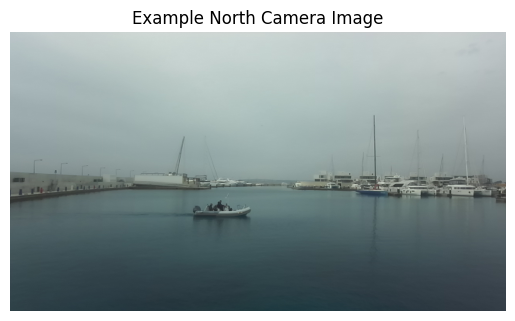

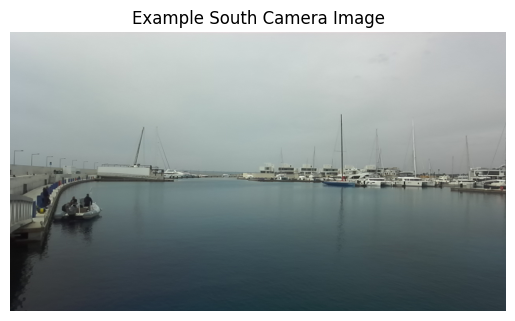

In [4]:
dataset_path = '/kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data'

north_image_example = os.path.join(dataset_path, 'North', '20250203_102634.png')
south_image_example = os.path.join(dataset_path, 'South', '20250203_102557.png')
images = [north_image_example, south_image_example]


img_north = cv2.imread(north_image_example)
img_north = cv2.cvtColor(img_north, cv2.COLOR_BGR2RGB)

img_south = cv2.imread(south_image_example)
img_south = cv2.cvtColor(img_south, cv2.COLOR_BGR2RGB)

plt.imshow(img_north)
plt.title('Example North Camera Image')
plt.axis('off')
plt.show()

plt.imshow(img_south)
plt.title('Example South Camera Image')
plt.axis('off')
plt.show()

## Testing some models

### YOLO12X

100%|██████████| 114M/114M [00:01<00:00, 111MB/s]  



0: 736x1280 51 boats, 118.0ms
1: 736x1280 79 boats, 118.0ms
Speed: 7.3ms preprocess, 118.0ms inference, 137.6ms postprocess per image at shape (1, 3, 736, 1280)

image 1/1 /kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data/North/20250203_102634.png: 736x1280 51 boats, 117.8ms
Speed: 6.2ms preprocess, 117.8ms inference, 2.4ms postprocess per image at shape (1, 3, 736, 1280)


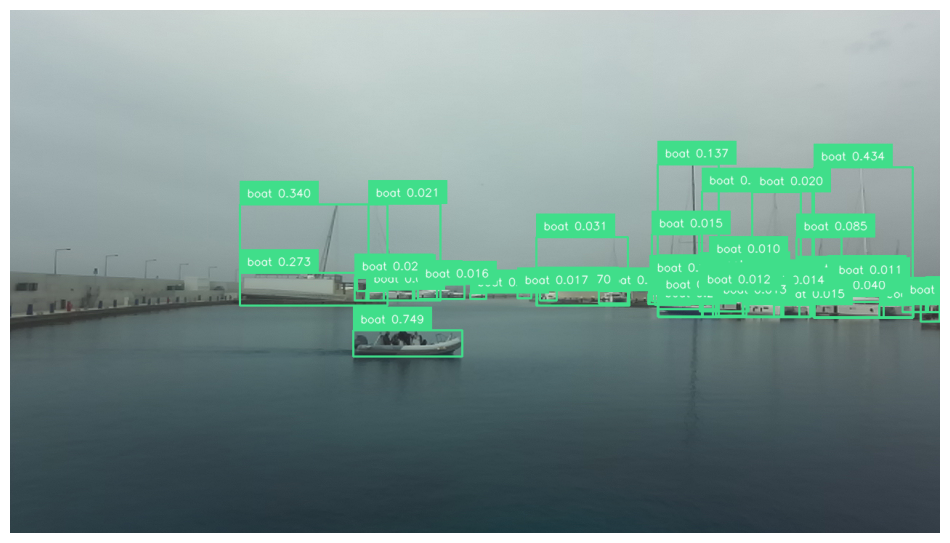


image 1/1 /kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data/South/20250203_102557.png: 736x1280 79 boats, 114.9ms
Speed: 3.0ms preprocess, 114.9ms inference, 1.8ms postprocess per image at shape (1, 3, 736, 1280)


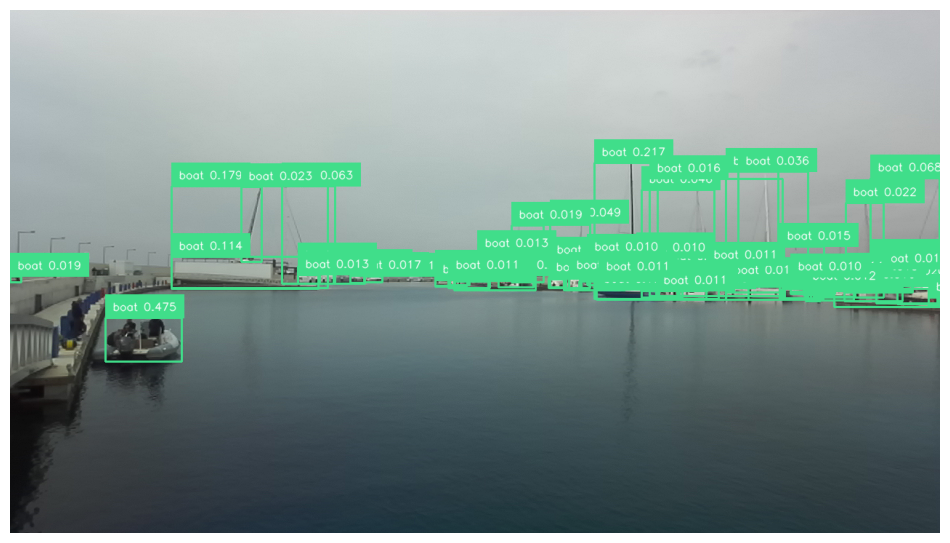

In [9]:
def yolo_inference(model, images, ID_classes, confidence_value, iou_value):
    clear_gpu_memory()
    
    results = model.predict(source=images, 
                        classes=[ID_classes], 
                        imgsz=1280, 
                        conf=confidence_value,
                        iou=iou_value,
                        agnostic_nms=True)

    BOUNDING_BOX_ANNOTATOR = sv.BoxAnnotator()
    LABEL_ANNOTATOR = sv.LabelAnnotator()
    
    for image in images:
        results = model.predict(source=image, 
                        imgsz=1280, 
                        conf=confidence_value,
                        iou=iou_value,
                        agnostic_nms=True)
        
        detections = sv.Detections.from_ultralytics(results[0])
        
        labels = [
            f"{model.names[class_id]} {confidence:0.3f}" 
            for class_id, confidence 
            in zip(detections.class_id, detections.confidence)
        ]

        image = cv2.imread(image)
        annotated_image = BOUNDING_BOX_ANNOTATOR.annotate(scene=image.copy(),
                                                      detections=detections)

        annotated_image = LABEL_ANNOTATOR.annotate(scene=annotated_image,
                                               detections=detections,
                                               labels=labels)

        sv.plot_image(annotated_image)
    clear_gpu_memory()


TARGET_CLASS = 'boat'
TARGET_CLASS_ID = 8  # COCO ID for 'boat'
CONFIDENCE_VALUE = 0.01
IoU_VALUE = 0.45


yolo_inference(model = YOLO("yolo12x.pt"), 
               images=images, 
               ID_classes = TARGET_CLASS_ID, 
               confidence_value = CONFIDENCE_VALUE, 
               iou_value=IoU_VALUE)

When we increase the confidence threshold and decrease IoU threshold:


0: 736x1280 6 boats, 117.2ms
1: 736x1280 5 boats, 117.2ms
Speed: 3.4ms preprocess, 117.2ms inference, 1.5ms postprocess per image at shape (1, 3, 736, 1280)

image 1/1 /kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data/North/20250203_102634.png: 736x1280 6 boats, 115.2ms
Speed: 2.6ms preprocess, 115.2ms inference, 1.5ms postprocess per image at shape (1, 3, 736, 1280)


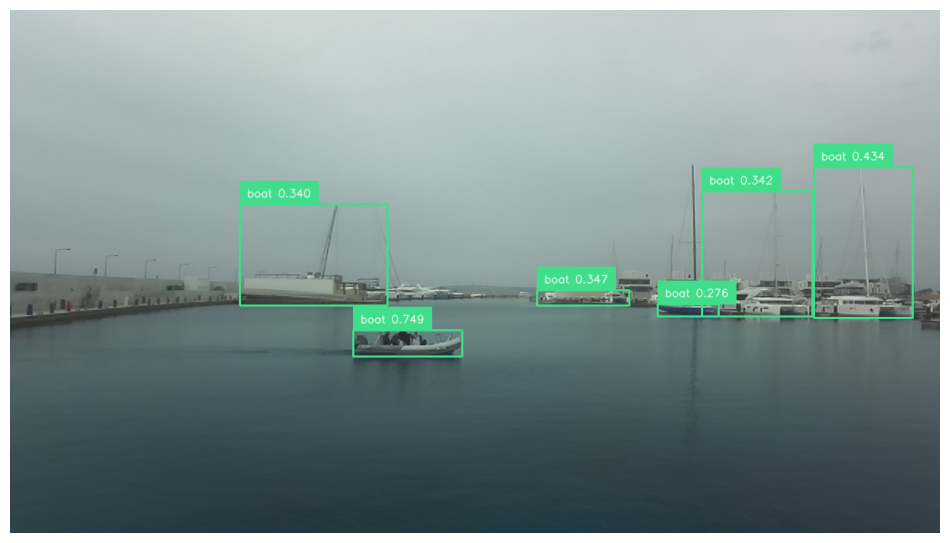


image 1/1 /kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data/South/20250203_102557.png: 736x1280 5 boats, 114.8ms
Speed: 3.1ms preprocess, 114.8ms inference, 1.8ms postprocess per image at shape (1, 3, 736, 1280)


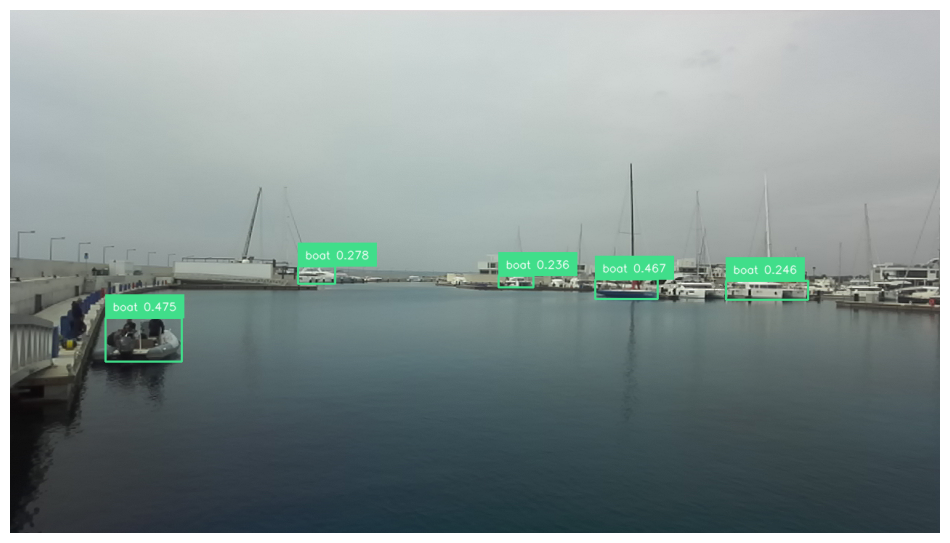

In [10]:
CONFIDENCE_VALUE = 0.2
IoU_VALUE = 0.05


yolo_inference(model = YOLO("yolo12x.pt"), 
               images=images, 
               ID_classes = TARGET_CLASS_ID, 
               confidence_value = CONFIDENCE_VALUE, 
               iou_value=IoU_VALUE)

### YOLO NAS (Neural Architecture Search)

[2025-07-29 04:08:48] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


The console stream is logged into /root/sg_logs/console.log


[2025-07-29 04:08:52] INFO - env_sanity_check.py - Library check is not supported when super_gradients installed through "git+https://github.com/..." command


100%|██████████| 328M/328M [00:03<00:00, 103MB/s]  



0: 736x1280 14 boats, 52.2ms
1: 736x1280 9 boats, 52.2ms
Speed: 3.7ms preprocess, 52.2ms inference, 1.5ms postprocess per image at shape (1, 3, 736, 1280)

image 1/1 /kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data/North/20250203_102634.png: 736x1280 14 boats, 65.2ms
Speed: 2.8ms preprocess, 65.2ms inference, 1.8ms postprocess per image at shape (1, 3, 736, 1280)


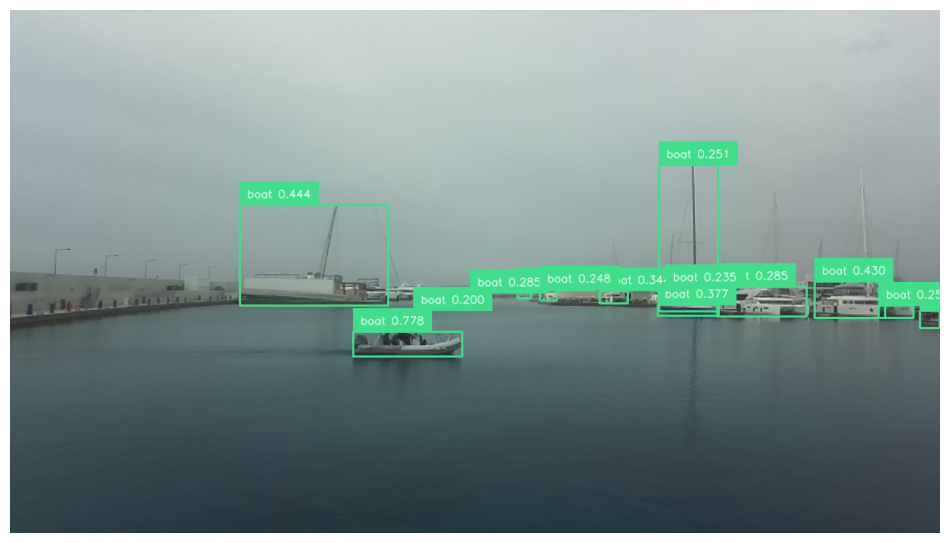


image 1/1 /kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data/South/20250203_102557.png: 736x1280 9 boats, 53.9ms
Speed: 3.0ms preprocess, 53.9ms inference, 3.1ms postprocess per image at shape (1, 3, 736, 1280)


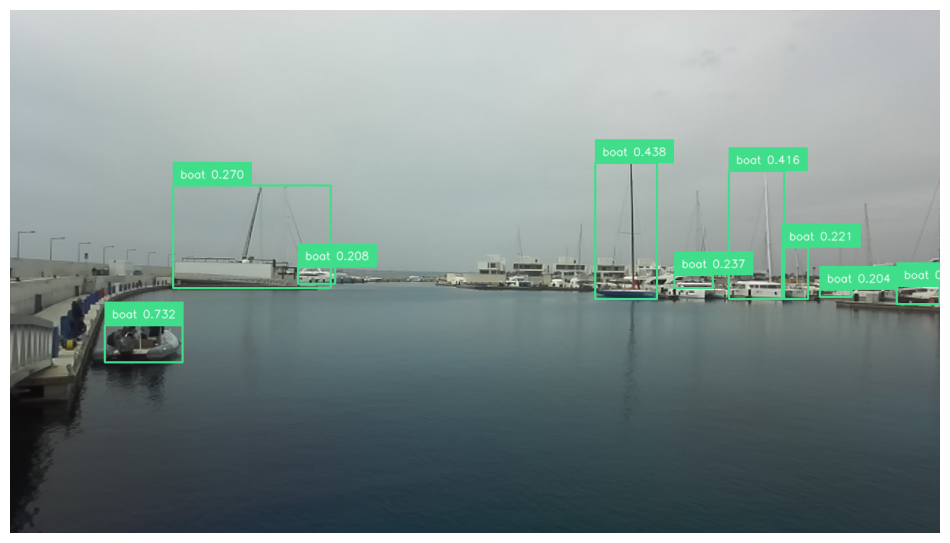

In [11]:
CONFIDENCE_VALUE = 0.2
IoU_VALUE = 0.05


yolo_inference(model = NAS("yolo_nas_l.pt"), 
               images=images, 
               ID_classes = TARGET_CLASS_ID, 
               confidence_value = CONFIDENCE_VALUE, 
               iou_value=IoU_VALUE)

### YOLO RT-DETR (A Vision Transformer-Based Real-Time Object Detector)

100%|██████████| 63.4M/63.4M [00:00<00:00, 93.7MB/s]



0: 1280x1280 33 boats, 81.4ms
1: 1280x1280 33 boats, 81.4ms
Speed: 9.1ms preprocess, 81.4ms inference, 1.3ms postprocess per image at shape (1, 3, 1280, 1280)

image 1/1 /kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data/North/20250203_102634.png: 1280x1280 33 boats, 87.6ms
Speed: 7.4ms preprocess, 87.6ms inference, 0.7ms postprocess per image at shape (1, 3, 1280, 1280)


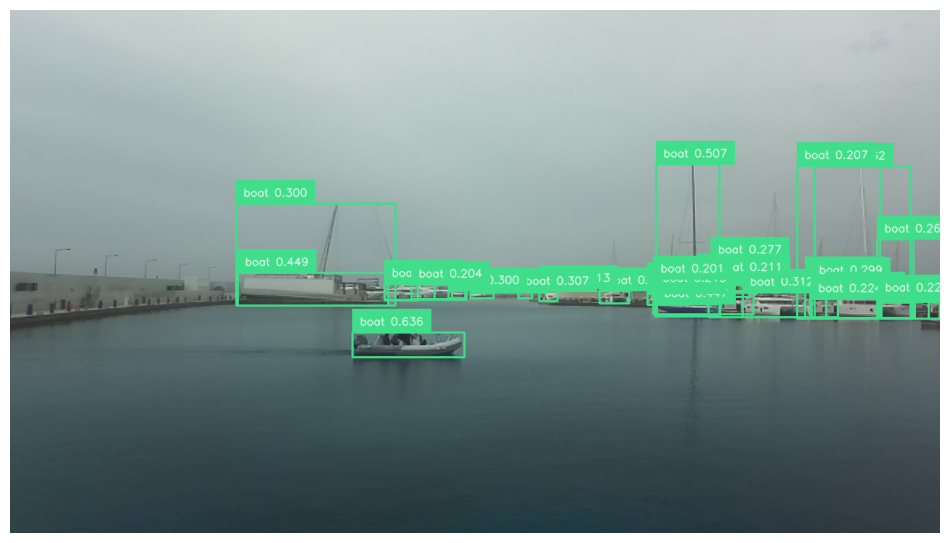


image 1/1 /kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data/South/20250203_102557.png: 1280x1280 33 boats, 86.1ms
Speed: 7.3ms preprocess, 86.1ms inference, 0.8ms postprocess per image at shape (1, 3, 1280, 1280)


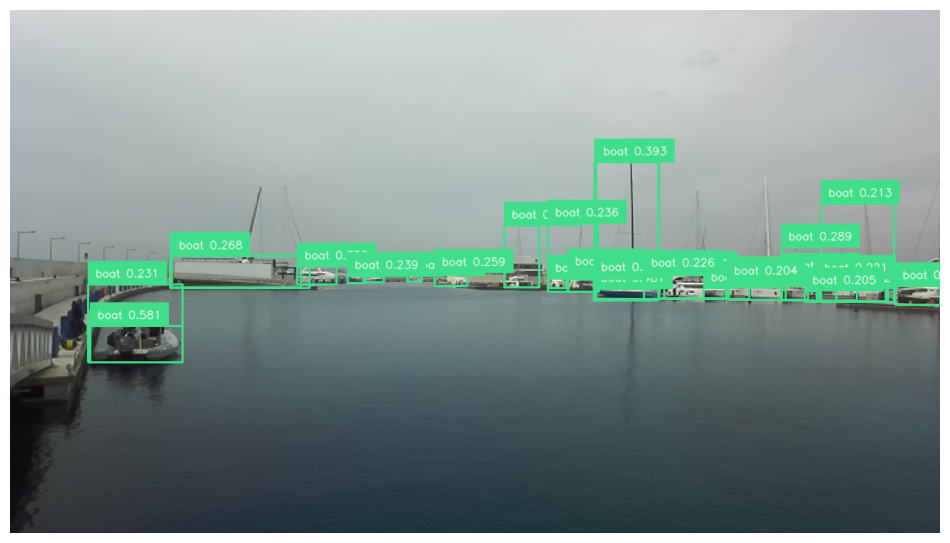

In [12]:
CONFIDENCE_VALUE = 0.2
IoU_VALUE = 0.05


yolo_inference(model = RTDETR("rtdetr-l.pt"), 
               images=images, 
               ID_classes = TARGET_CLASS_ID, 
               confidence_value = CONFIDENCE_VALUE, 
               iou_value=IoU_VALUE)

### YOLO WORLD (real-time Ultralytics YOLOv8-based approach for Open-Vocabulary Detection tasks)


image 1/1 /kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data/North/20250203_102634.png: 736x1280 28 boats, 77.0ms
Speed: 3.0ms preprocess, 77.0ms inference, 1.5ms postprocess per image at shape (1, 3, 736, 1280)


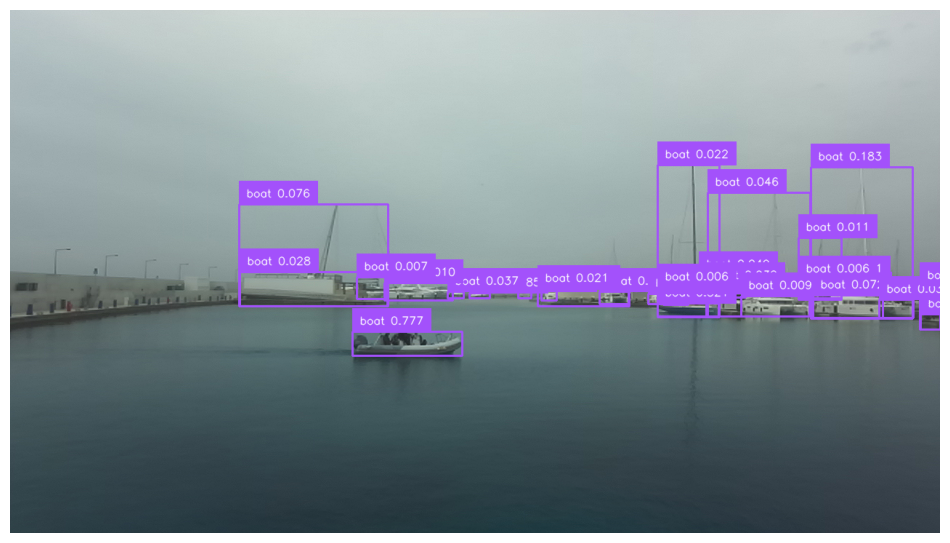


image 1/1 /kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data/South/20250203_102557.png: 736x1280 34 boats, 71.1ms
Speed: 3.5ms preprocess, 71.1ms inference, 1.9ms postprocess per image at shape (1, 3, 736, 1280)


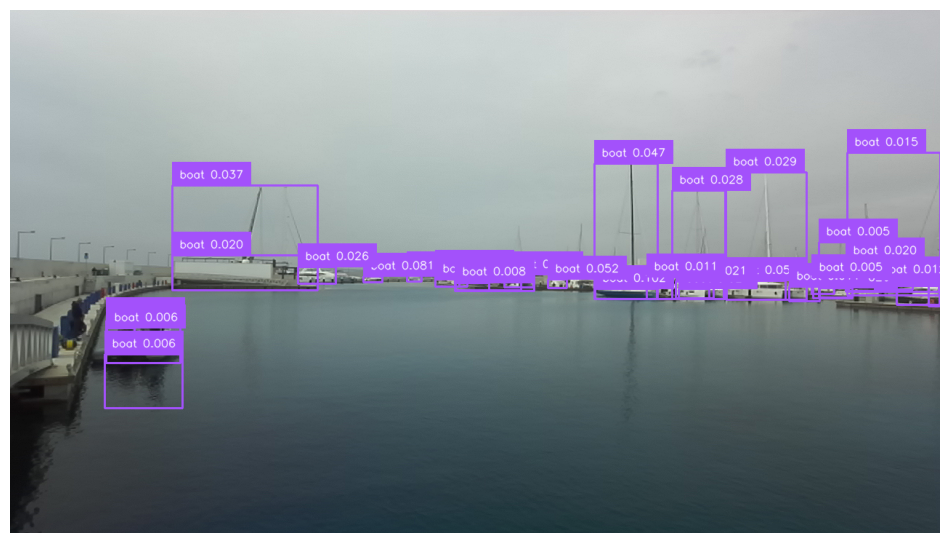

In [15]:
def yolo_world_inference(model, images, list_of_classes, confidence_value, iou_value):
    clear_gpu_memory()
    
    model.set_classes(list_of_classes)
    
    BOUNDING_BOX_ANNOTATOR = sv.BoxAnnotator()
    LABEL_ANNOTATOR = sv.LabelAnnotator()

    for image in images:
        results = model.predict(source=image, 
                        imgsz=1280, 
                        conf=confidence_value,
                        iou=iou_value,
                        agnostic_nms=True)
        
        detections = sv.Detections.from_ultralytics(results[0])
        
        labels = [
            f"{model.names[class_id]} {confidence:0.3f}" 
            for class_id, confidence 
            in zip(detections.class_id, detections.confidence)
        ]

        image = cv2.imread(image)
        annotated_image = BOUNDING_BOX_ANNOTATOR.annotate(scene=image.copy(),
                                                      detections=detections)

        annotated_image = LABEL_ANNOTATOR.annotate(scene=annotated_image,
                                               detections=detections,
                                               labels=labels)

        sv.plot_image(annotated_image)
        clear_gpu_memory()


CONFIDENCE_VALUE = 0.005
IoU_VALUE = 0.45

yolo_world_inference(model = YOLOWorld("yolov8x-worldv2.pt"),
                     images=images,
                     list_of_classes = ["boat"],
                     confidence_value = CONFIDENCE_VALUE,
                     iou_value=IoU_VALUE)

And with higher value of confidence threshold:


image 1/1 /kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data/North/20250203_102634.png: 736x1280 4 boats, 71.1ms
Speed: 3.3ms preprocess, 71.1ms inference, 1.6ms postprocess per image at shape (1, 3, 736, 1280)


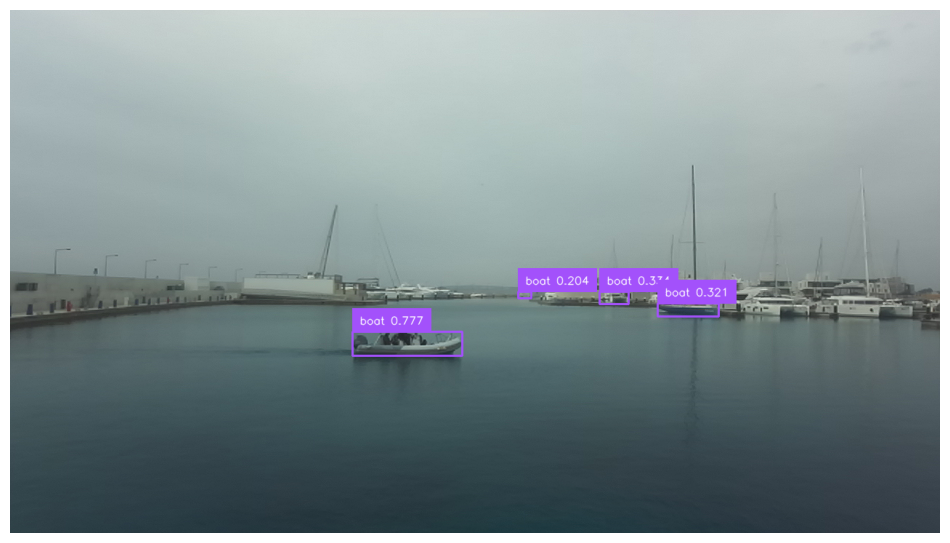


image 1/1 /kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data/South/20250203_102557.png: 736x1280 1 boat, 70.4ms
Speed: 3.5ms preprocess, 70.4ms inference, 1.6ms postprocess per image at shape (1, 3, 736, 1280)


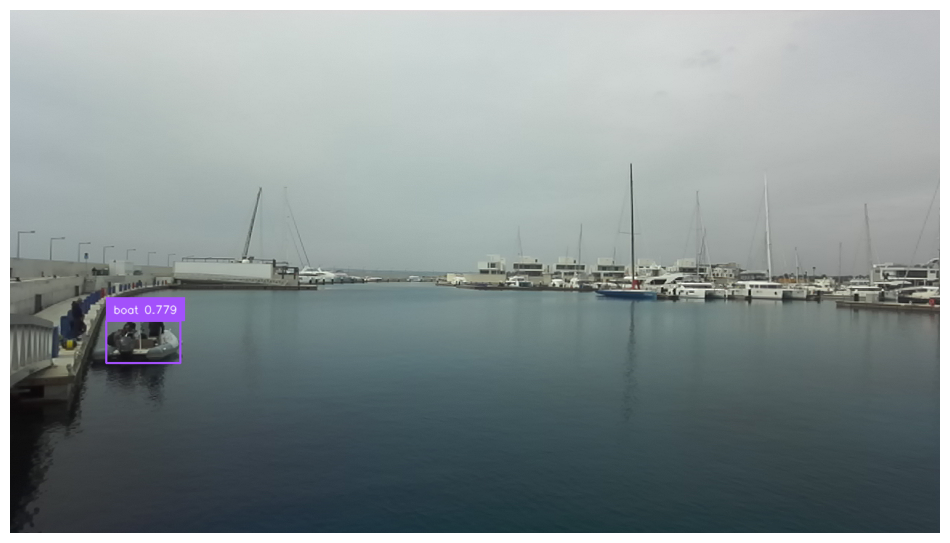

In [16]:
CONFIDENCE_VALUE = 0.2
IoU_VALUE = 0.45

yolo_world_inference(model = YOLOWorld("yolov8x-worldv2.pt"),
                     images=images,
                     list_of_classes = ["boat"],
                     confidence_value = CONFIDENCE_VALUE,
                     iou_value=IoU_VALUE)

## Comparison models with each other using small validation dataset (55 images)

Let's compare different models with each other using classical detection metrics: F1, Precision, Recal, mAP50, mAP75 and mAP5095. The validation dataset `/kaggle/input/marina-validation` with 55 images was prepared using Roboflow (https://app.roboflow.com/)

In [17]:
# --- CONFIGURATION (Using a Dataclass for clarity and type safety) ---
@dataclass
class ExperimentConfig:

    dataset_path: str = '/kaggle/input/marina-stereo-vision-vessel-images'
    validation_data_yaml: str = '/kaggle/input/marina-validation/data.yaml'
    
    MODEL_LOADERS: dict = field(default_factory=lambda: {"YOLO-standard": YOLO,
                                                         "YOLO-world": YOLOWorld,
                                                         "YOLO-NAS": NAS})
    
    models_to_test: dict = field(default_factory=lambda: {
        "YOLO8x":        {"path": "yolov8x.pt",             "type": "YOLO-standard"},
        "YOLO8l":        {"path": "yolov8l.pt",             "type": "YOLO-standard"},
        "YOLO12x":        {"path": "yolo12x.pt",             "type": "YOLO-standard"},
        "YOLO12l":        {"path": "yolo12l.pt",             "type": "YOLO-standard"},
        "YOLO8x-World-v2":  {"path": "yolov8x-worldv2.pt",     "type": "YOLO-world"},
        "YOLO8l-World-v2":  {"path": "yolov8l-worldv2.pt",     "type": "YOLO-world"},
        "YOLO8x-World":  {"path": "yolov8x-world.pt",     "type": "YOLO-world"},
        "YOLO8l-World":  {"path": "yolov8l-world.pt",     "type": "YOLO-world"},
        "RT-DETR-X":      {"path": "rtdetr-x.pt",            "type": "YOLO-standard"},
        "RT-DETR-L":      {"path": "rtdetr-l.pt",            "type": "YOLO-standard"},
        "YOLO-NAS-L":      {"path": "yolo_nas_l.pt",            "type": "YOLO-NAS"},
        "YOLO-NAS-M":      {"path": "yolo_nas_m.pt",            "type": "YOLO-NAS"},        
})

    open_vocab_classes: list[str] = field(default_factory=lambda: ["boat"])
    standard_yolo_class_id: list[int] = field(default_factory=lambda: [8]) # COCO boat ID

    # Inference Parameters
    confidence_threshold: float = 0.25
    iou_threshold: float = 0.45
    image_size: int = 1280
    batch: int = 1
    chunk_size: int = 10  
    primary_model_name: str = "YOLO-World"

    enable_memory_monitoring: bool = True
    adaptive_chunking: bool = True
    memory_cleanup_frequency: int = 5  # Clear memory every N chunks
    max_memory_usage_gb: float = 15.0   # Maximum GPU memory to use

# ---------------------------------------------------------------
#  CONFIDENCE THRESHOLD CALIBRATION
# ---------------------------------------------------------------
def sweep_confidence(model, val_yaml, conf_list, eval_kwargs):
    """Return a list of dicts: [{'conf': 0.05, 'P':..., 'R':..., 'F1':..., 'mAP':...}, …]"""
    results = []
    for c in conf_list:
        mets = model.val(data=val_yaml, conf=c, cache=False, plots=False, **eval_kwargs)
        P, R  = float(mets.box.p[0]), float(mets.box.r[0])
       
        f1   = 0 if (P+R)==0 else 2*P*R/(P+R)
        results.append(dict(conf=c,
                            F1=f1,
                            P=P, 
                            R=R,
                            mAP50=float(mets.box.map50),
                            mAP75=float(mets.box.map75),
                            mAP5095=float(mets.box.map)))
        clear_gpu_memory()
    return results

def plot_calibration_results(sweep_df: pd.DataFrame, calibrated_df: pd.DataFrame):
    """Plots F1 vs Conf for all models and other models perfomance graphs"""
    
    sns.set_palette("Paired")
    
    plt.figure(figsize=(14, 6))
    for model_name in calibrated_df['model']:
        sub = sweep_df[sweep_df['model']==model_name]
        sns.lineplot(x='conf', y='F1', data=sub, marker='o', label=model_name)
    plt.title("F1 vs Confidence", fontsize=16)
    plt.ylabel("F1", fontsize=14)
    plt.xlabel("Confidence", fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(14, 6))
    for model_name in calibrated_df['model']:
        sub = sweep_df[sweep_df['model']==model_name]
        sns.lineplot(x='conf', y='P', data=sub, marker='o', label=model_name)
    plt.title("Precision vs Confidence", fontsize=16)
    plt.ylabel("Precision", fontsize=14)
    plt.xlabel("Confidence", fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(14, 6))
    for model_name in calibrated_df['model']:
        sub = sweep_df[sweep_df['model']==model_name]
        sns.lineplot(x='conf', y='R', data=sub, marker='o', label=model_name)
    plt.title("Recall vs Confidence", fontsize=16)
    plt.ylabel("Recall ", fontsize=14)
    plt.xlabel("Confidence", fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(14, 6))
    for model_name in calibrated_df['model']:
        sub = sweep_df[sweep_df['model']==model_name]
        sns.lineplot(x='conf', y='mAP50', data=sub, marker='o', label=model_name)
    plt.title("mAP50 vs Confidence", fontsize=16)
    plt.ylabel("mAP50 ", fontsize=14)
    plt.xlabel("Confidence", fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(14, 6))
    for model_name in calibrated_df['model']:
        sub = sweep_df[sweep_df['model']==model_name]
        sns.lineplot(x='conf', y='mAP75', data=sub, marker='o', label=model_name)
    plt.title("mAP75 vs Confidence", fontsize=16)
    plt.ylabel("mAP75 ", fontsize=14)
    plt.xlabel("Confidence", fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(14, 6))
    for model_name in calibrated_df['model']:
        sub = sweep_df[sweep_df['model']==model_name]
        sns.lineplot(x='conf', y='mAP5095', data=sub, marker='o', label=model_name)
    plt.title("mAP5095 vs Confidence", fontsize=16)
    plt.ylabel("mAP5095 ", fontsize=14)
    plt.xlabel("Confidence", fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Set style
    plt.style.use('default')
    sns.set_palette("tab10")

    # Create comprehensive visualizations
    fig, axes = plt.subplots(3, 1, figsize=(15, 15))
    fig.suptitle('Model Performance Analysis', fontsize=20, fontweight='bold')

    # 1. F1 Score by Model (Bar plot)
    ax1 = axes[0]
    bars = ax1.bar(range(len(calibrated_df)), calibrated_df['F1'], 
                color=sns.color_palette("viridis", len(calibrated_df)))
    ax1.set_title('F1 Score by Model', fontsize=14, fontweight='bold')
    ax1.set_ylabel('F1 Score', fontsize=12)
    ax1.set_xlabel('Models', fontsize=12)
    ax1.set_xticks(range(len(calibrated_df)))
    ax1.set_xticklabels(calibrated_df['model'], rotation=45, ha='right')
    ax1.grid(True, alpha=0.3)

    # Add value labels on bars
    for i, bar in enumerate(bars):
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height + 0.005,
                f'{height:.3f}', ha='center', va='bottom', fontsize=9)

    # 2. mAP Metrics Comparison
    ax2 = axes[1]
    metrics = ['mAP50', 'mAP75', 'mAP5095']
    x = np.arange(len(calibrated_df))
    width = 0.25

    for i, metric in enumerate(metrics):
        ax2.bar(x + i*width, calibrated_df[metric], width, 
                label=metric, alpha=0.8)

    ax2.set_title('mAP Metrics Comparison', fontsize=14, fontweight='bold')
    ax2.set_ylabel('mAP Score', fontsize=12)
    ax2.set_xlabel('Models', fontsize=12)
    ax2.set_xticks(x + width)
    ax2.set_xticklabels(calibrated_df['model'], rotation=45, ha='right')
    ax2.legend()
    ax2.grid(True, alpha=0.3)

    # 3. Precision vs Recall
    ax3 = axes[2]
    scatter = ax3.scatter(calibrated_df['R'], calibrated_df['P'], 
                        c=calibrated_df['F1'], s=100, cmap='viridis', alpha=0.7)
    ax3.set_title('Precision vs Recall (colored by F1)', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Recall', fontsize=12)
    ax3.set_ylabel('Precision', fontsize=12)
    ax3.set_xlim(0.2, 0.65)
    ax3.set_ylim(0.1, 0.5)
    ax3.grid(True, alpha=0.3)
    plt.colorbar(scatter, ax=ax3, label='F1 Score')

    # Add model labels
    for i, model in enumerate(calibrated_df['model']):
        ax3.annotate(model, (calibrated_df['R'].iloc[i], calibrated_df['P'].iloc[i]),
                    xytext=(5, 5), textcoords='offset points', fontsize=8, alpha=0.7)


    plt.tight_layout()
    plt.show()

def calibrate_models(config: ExperimentConfig, conf_grid=np.arange(0.05, 0.9, 0.05)):
    """
    For every model in config.models_to_test:
        1. sweep confidence
        2. pick threshold with max-F1
        3. run final val at that threshold
    Returns two DataFrames: sweep_df, final_df
    """
    clear_gpu_memory()
    sweep_records, final_records = [], []
    conf_grid = [0.002,0.005,0.008, 0.01,0.02,0.03,0.04,0.05,0.06,0.075, 0.1, 0.125, 0.15, 0.175, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.6, 0.7]
    for name, info in config.models_to_test.items():
        print(f"\n➡️  Calibrating {name}")
        model_type = info['type']
        loader = config.MODEL_LOADERS[model_type]
        model  = loader(info['path'])
        
        # same detection vs open-vocab prep as before
        eval_args = dict(task='detect',
                         imgsz=config.image_size,
                         iou=config.iou_threshold,
                         split='val',
                         single_cls=True,
                         verbose=False)
        if model_type == "YOLO-world":
            model.set_classes(config.open_vocab_classes)

        sweep = sweep_confidence(model, config.validation_data_yaml,
                                 conf_grid, eval_args)
        sweep_records += [dict(model=name, **x) for x in sweep]

        # pick best conf
        best = max(sweep, key=lambda d: d['F1'])
        print(f"   best conf={best['conf']:.2f} | F1={best['F1']:.3f}  "
              f"mAP50={best['mAP50']:.3f}")
        
        # run once more to store full metrics (inc. mAP75 etc.)
        clear_gpu_memory()
        mets = model.val(data=config.validation_data_yaml,
                         conf=best['conf'], cache=False, plots=False, **eval_args)
        final_records.append(dict(
            model   = name,
            conf    = best['conf'],
            F1      = best['F1'],
            mAP50   = float(mets.box.map50),
            mAP75   = float(mets.box.map75),
            mAP5095 = float(mets.box.map),
            P       = float(mets.box.p[0]),
            R       = float(mets.box.r[0]),
        ))
        safe_model_delete(model)
    
    sweep_df = pd.DataFrame(sweep_records)
    final_df = pd.DataFrame(final_records)

    sweep_df = sweep_df.replace([np.inf, -np.inf], np.nan)
    final_df = final_df.replace([np.inf, -np.inf], np.nan)

    return sweep_df, final_df

In [ ]:
sweep_df_55images, calibrated_df_55images = calibrate_models(ExperimentConfig())

Let's plot the obtained results

In [ ]:
plot_calibration_results(sweep_df_55images, calibrated_df_55images)

## Comparison models using bigger validation dataset (200 images)

Let's expand the validation dataset to 200 images and recalculate metrics to ensure that the situation with  the top-performed models does not change

In [ ]:
calibration_config_test_200images = ExperimentConfig()
calibration_config_test_200images.validation_data_yaml = '/kaggle/input/marina-validation-200/data.yaml'

sweep_df_200images, calibrated_df_200images = calibrate_models(calibration_config_test_200images)

Plot the obtained outcomes:

In [ ]:
plot_calibration_results(sweep_df_200images, calibrated_df_200images)

## Retest top-performed model with low value of IoU = 0.05

In [ ]:
# --- CONFIGURATION (Using a Dataclass for clarity and type safety) ---
@dataclass
class ExperimentConfig:

    dataset_path: str = '/kaggle/input/marina-stereo-vision-vessel-images'
    validation_data_yaml: str = '/kaggle/input/marina-validation/data.yaml'
    
    MODEL_LOADERS: dict = field(default_factory=lambda: {"YOLO-standard": YOLO,
                                                         "YOLO-world": YOLOWorld,
                                                         "YOLO-NAS": NAS})
    
    models_to_test: dict = field(default_factory=lambda: {
        "YOLO12l":        {"path": "yolo12l.pt",             "type": "YOLO-standard"},
        "YOLO8x-World-v2":  {"path": "yolov8x-worldv2.pt",     "type": "YOLO-world"},
        "YOLO8l-World-v2":  {"path": "yolov8l-worldv2.pt",     "type": "YOLO-world"},
        "YOLO8x-World":  {"path": "yolov8x-world.pt",     "type": "YOLO-world"},
        "YOLO8l-World":  {"path": "yolov8l-world.pt",     "type": "YOLO-world"}       
})

    open_vocab_classes: list[str] = field(default_factory=lambda: ["boat"])
    standard_yolo_class_id: list[int] = field(default_factory=lambda: [8]) # COCO boat ID

    # Inference Parameters
    confidence_threshold: float = 0.25
    iou_threshold: float = 0.05
    image_size: int = 1280
    batch: int = 1
    chunk_size: int = 10  
    primary_model_name: str = "YOLO-World"

    enable_memory_monitoring: bool = True
    adaptive_chunking: bool = True
    memory_cleanup_frequency: int = 5  # Clear memory every N chunks
    max_memory_usage_gb: float = 15.0   # Maximum GPU memory to use

calibration_config_test_200images_IoU_0_05 = ExperimentConfig()
calibration_config_test_200images_IoU_0_05.validation_data_yaml = '/kaggle/input/marina-validation-200/data.yaml'
calibration_config_test_200images_IoU_0_05.iou_threshold = 0.05

sweep_df_200images_IoU_0_05, calibrated_df_200images_IoU_0_05 = calibrate_models(calibration_config_test_200images_IoU_0_05)

Plot the results:

In [ ]:
plot_calibration_results(sweep_df_200images_IoU_0_05, calibrated_df_200images_IoU_0_05)

## Make final JSONs with predictions using top-performed model

In [5]:
# --- CONFIGURATION (Using a Dataclass for clarity and type safety) ---
@dataclass
class FinalExperimentConfig:

    dataset_path: str = '/kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data'
    validation_data_yaml: str = '/kaggle/input/marina-validation-200/data.yaml'
    
    MODEL_LOADERS: dict = field(default_factory=lambda: {"YOLO-standard": YOLO,
                                                         "YOLO-world": YOLOWorld,
                                                         "YOLO-NAS": NAS})
    
    models_to_test: dict = field(default_factory=lambda: {
        # Model Name: {path, type, optimal_conf, optimal_iou}
        "YOLO12l":         {"path": "yolo12l.pt",         "type": "YOLO-standard", "conf": 0.008,"iou": 0.05},
        "YOLO8x-World-v2": {"path": "yolov8x-worldv2.pt", "type": "YOLO-world",    "conf": 0.008,"iou": 0.05},
        "YOLO8x-World":    {"path": "yolov8x-world.pt",   "type": "YOLO-world",    "conf": 0.008,"iou": 0.05},
        "YOLO8l-World-v2": {"path": "yolov8l-worldv2.pt", "type": "YOLO-world",    "conf": 0.008,"iou": 0.05},
        "YOLO8l-World":    {"path": "yolov8l-world.pt",   "type": "YOLO-world",    "conf": 0.008,"iou": 0.05},
    })

    open_vocab_classes: list[str] = field(default_factory=lambda: ["boat"])
    standard_yolo_class_id: list[int] = field(default_factory=lambda: [8]) # COCO boat ID

    # Inference Parameters
    image_size: int = 1280
    batch: int = 1
    chunk_size: int = 10  
    primary_model_name: str = "YOLO8x-World-v2"

    enable_memory_monitoring: bool = True
    adaptive_chunking: bool = True
    memory_cleanup_frequency: int = 5  # Clear memory every N chunks
    max_memory_usage_gb: float = 15.0   # Maximum GPU memory to use
     

# --- 4. VISUALIZATION FUNCTION ---

def visualize_validation_metrics(validation_df: pd.DataFrame):
    """Handles all plotting logic for validation metrics."""
    if validation_df.empty:
        print("Validation results DataFrame is empty. Skipping quantitative plots.")
        return
        
    print("\n--- Generating Quantitative Validation Plots ---")
    sns.set_theme(style="whitegrid")
    
    fig, axes = plt.subplots(1, 3, figsize=(22, 7), sharey=True)
    fig.suptitle('Quantitative Metric Comparison: mAP Scores', fontsize=20)
    
    metrics_to_plot = ["mAP50", "mAP75", "mAP50-95"]
    titles = ["mAP @ 0.50 IoU (PASCAL VOC)", "mAP @ 0.75 IoU (Strict)", "mAP @ .50-.95 IoU (COCO Primary)"]
    
    for i, (ax, metric, title) in enumerate(zip(axes, metrics_to_plot, titles)):
        sns.barplot(data=validation_df, x='model', y=metric, ax=ax, palette="viridis")
        ax.set_title(title, fontsize=16)
        ax.set_xlabel("Model", fontsize=12)
        if i == 0:
            ax.set_ylabel("Score", fontsize=12)
        else:
            ax.set_ylabel("") # Set no label for other plots
        ax.tick_params(axis='x', rotation=45)
        ax.set_ylim(0, 1.0) 

        for container in ax.containers:
            ax.bar_label(container, fmt='%.3f', fontsize=12)
            
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


    pr_df = validation_df.melt(id_vars='model', value_vars=['precision', 'recall'],
                               var_name='metric', value_name='score')
                               
    plt.figure(figsize=(12, 7))
    sns.barplot(data=pr_df, x='model', y='score', hue='metric', palette="rocket")
    plt.title("Quantitative Metric Comparison: Precision & Recall", fontsize=20)
    plt.xlabel("Model", fontsize=12)
    plt.ylabel("Score", fontsize=12)
    plt.ylim(0, 1.0)
    plt.xticks(rotation=80)
    plt.legend(title='Metric')
    plt.tight_layout()
    plt.show()

    f1_df = validation_df.melt(id_vars='model', value_vars='F1',
                               var_name='metric', value_name='score')
                               
    plt.figure(figsize=(12, 7))
    sns.barplot(data=f1_df, x='model', y='score', hue='metric', palette="rocket")
    plt.title("Quantitative Metric Comparison: F1", fontsize=20)
    plt.xlabel("Model", fontsize=12)
    plt.ylabel("Score", fontsize=12)
    plt.ylim(0, 1.0)
    plt.xticks(rotation=80)
    plt.legend(title='Metric')
    plt.tight_layout()
    plt.show()

def visualize_proxy_metrics(results_df: pd.DataFrame, config: FinalExperimentConfig):
    """Handles all plotting logic."""
    print("\n--- Generating All Plots ---")
    sns.set_theme(style="whitegrid")
    
    with warnings.catch_warnings():
        warnings.simplefilter(action='ignore', category=FutureWarning)
    
        fig_line, axes_line = plt.subplots(len(config.models_to_test), 2, figsize=(22, 6 * len(config.models_to_test)), sharex=True)
        if len(config.models_to_test) == 1: axes_line = np.array([axes_line]) # Ensure 2D array
        fig_line.suptitle('Proxy Metrics 1 & 2: Performance Over Time', fontsize=22, y=1.0)
    
        for i, model_name in enumerate(config.models_to_test.keys()):
            model_df = results_df[results_df['model'] == model_name]
            
            # Plot Detection Count on the left column
            ax_count = axes_line[i, 0]
            sns.lineplot(data=model_df, x='timestamp_dt', y='detection_count', hue='camera', ax=ax_count, marker='o', markersize=3)
            ax_count.set_title(f'{model_name} - Detection Count', fontsize=12)
            ax_count.set_ylabel('Number of Detections')
            ax_count.set_ylim(0, 40)
    
            # Plot Average Confidence on the right column
            ax_conf = axes_line[i, 1]
            model_df_with_detections = model_df[model_df['detection_count'] > 0]
            sns.lineplot(data=model_df_with_detections, x='timestamp_dt', y='avg_confidence', hue='camera', ax=ax_conf, marker='o', markersize=3)
            ax_conf.set_title(f'{model_name} - Average Confidence', fontsize=12)
            ax_conf.set_ylabel('Average Confidence')
            ax_conf.set_ylim(0, 0.9)
    
        plt.tight_layout(rect=[0, 0, 1, 0.97])
        plt.show()
    
        # --- Plot 3: Confidence Histograms ---
        fig_hist, axes_hist = plt.subplots(1, len(config.models_to_test), sharey=True, figsize=(18, 6))
        if len(config.models_to_test) == 1: axes_hist = [axes_hist]
        fig_hist.suptitle('Proxy Metric 3: Histogram of All Detection Confidences', fontsize=20, y=1.0)
    
        for ax, model_name in zip(axes_hist, config.models_to_test.keys()):
            all_confs = results_df[results_df['model'] == model_name]['all_confidences'].explode().dropna().astype(float)
            sns.histplot(all_confs, ax=ax, bins=50, kde=True)
            ax.set_title(f'Model: {model_name}', fontsize=7)
            ax.set_xlabel('Confidence Score')
            ax.set_xlim(0, 1.0)
        
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()
    
        # --- Plot 4: Boxplots for Stability Analysis ---
        fig_box, axes_box = plt.subplots(1, 2, figsize=(20, 8), sharey=True)
        fig_box.suptitle('Proxy Metric 4: Stability Analysis via Detection Count Distribution', fontsize=22, y=1.03)
    
        camera_sources = [("North", "Distribution for North Camera"), ("South", "Distribution for South Camera")]
        model_order = list(config.models_to_test.keys())
    
        for ax, (camera_name, title) in zip(axes_box, camera_sources):
            
            camera_df = results_df[results_df['camera'] == camera_name]
            
            sns.boxplot(data=camera_df, x='model', y='detection_count', ax=ax, order=model_order, medianprops={'color': 'red', 'linewidth': 2}, showmeans=False)
            
            means = camera_df.groupby('model')['detection_count'].mean().reindex(model_order)
            ax.scatter(x=range(len(means)), y=means, marker='D', color='black', s=100, zorder=10, label='Mean')
            
            ax.set_title(title, fontsize=10)
            ax.set_xlabel("Model", fontsize=10)
            ax.tick_params(axis='x', labelrotation=60)
            if ax == axes_box[0]:
                ax.set_ylabel("Number of Detections", fontsize=12)
            else:
                ax.set_ylabel("", fontsize=12) # Explicitly set no label for others
        
        mean_handle = Line2D([0], [0], marker='D', color='w', label='Mean', markerfacecolor='black', markersize=10)
        median_handle = Line2D([0], [0], color='red', lw=2, label='Median')
        fig_box.legend(handles=[mean_handle, median_handle], loc='upper right', fontsize=12)
    
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()
    
    print("\n--- All Plots Generated ---")


# --- ORCHESTRATION & ANALYSIS FUNCTION ---
def examine_models(config: FinalExperimentConfig):
    """
    Orchestrates the model examination, including proxy metrics and quantitative validation.
    """
    clear_gpu_memory(verbose=True)
    
    all_proxy_results = []
    all_validation_results = []
    json_acc = init_json_accumulators()
    
    frame_sources = {"North": os.path.join(config.dataset_path, 'North'),
                     "South": os.path.join(config.dataset_path, 'South')}
    
    for model_name, model_info in config.models_to_test.items():
        print(f"\n{'='*20} Processing Model: {model_name} {'='*20}")
        print(f"Using calibrated parameters: conf={model_info['conf']}, iou={model_info['iou']}")
        
        # Clear memory before loading new model
        clear_gpu_memory(verbose=True)
        
        model_type = model_info.get("type")
        model_loader = config.MODEL_LOADERS.get(model_type)
        
        if not model_loader:
            raise ValueError(f"Unknown model type '{model_type}' for model '{model_name}'. Check config.")
        
        model = model_loader(model_info['path'])

        inference_params = {
            "imgsz": config.image_size,
            "conf": model_info['conf'],  # <-- Read model-specific confidence
            "iou": model_info['iou'],    # <-- Read model-specific IoU
            "agnostic_nms": True,
            "verbose": False,
            "batch": config.batch
        }
        
        if model_type == "YOLO-world":
            model.set_classes(config.open_vocab_classes)
            inference_params["classes"] = None
        else: # "YOLO-standard"
            inference_params["classes"] = config.standard_yolo_class_id

                
        # --Validation step begins---
        try:
            with gpu_memory_guard(threshold_gb=1.0, verbose=True):
                metrics = model.val(data=config.validation_data_yaml,
                                    task='detect',
                                    imgsz=config.image_size,
                                    conf=model_info['conf'],
                                    iou=model_info['iou'],
                                    split='val',
                                    plots=True,
                                    save_json=False,
                                    single_cls=True,
                                    cache=False,
                                    verbose=False)
                
                Precision, Recall  = float(metrics.box.p[0]), float(metrics.box.r[0])
                F1 = 0 if (Precision + Recall) == 0 else 2 * Precision * Recall/(Precision + Recall)

                all_validation_results.append({"model": model_name, 
                                               "mAP50-95": metrics.box.map, "mAP50": metrics.box.map50, "mAP75": metrics.box.map75,
                                               "precision": Precision, "recall": Recall,"F1": F1
                                              })
                print(f"✔ Validation successful for {model_name}.")
                print(f"  mAP@.5:.95: {metrics.box.map:.3f}, mAP@.5: {metrics.box.map50:.3f}, mAP@.75: {metrics.box.map75:.3f}")
                
        except Exception as e:
            print(f"❌ Validation failed for {model_name}: {e}")
            clear_gpu_memory(verbose=True)
        # ---Validation step ends---
        
        # ---inference step begins---
        for source_name, source_path in frame_sources.items():
            print(f"--- Processing {source_name} frames  ---")            
            
            image_files = sorted([os.path.join(source_path, f) for f in os.listdir(source_path) if f.endswith('.png')])
            
            if not image_files:
                continue

            
            total_images = len(image_files)

            # Adaptive chunk sizing based on available memory
            if config.adaptive_chunking and torch.cuda.is_available():
                available_memory = (torch.cuda.get_device_properties(0).total_memory / 1024**3) - (torch.cuda.memory_allocated() / 1024**3)
                chunk_size = adaptive_chunk_size(available_memory, config.image_size, config.chunk_size)
                print(f"Using adaptive chunk size: {chunk_size} (available memory: {available_memory:.2f}GB)")
            else:
                chunk_size = config.chunk_size
            
            chunk_count = 0
            
            for chunk_start in tqdm(range(0, total_images, chunk_size)): # Process images in chunks to manage memory
                
                chunk_end = min(chunk_start + config.chunk_size, total_images)
                chunk_files = image_files[chunk_start:chunk_end]  
                chunk_count += 1
               
                try:
                    with gpu_memory_guard(threshold_gb=0.5):
                        results_generator = model.predict(source=chunk_files, stream=True, **inference_params)
                        
                        for result, image_path in zip(results_generator, chunk_files):
                            timestamp = Path(image_path).stem

                            if model_name == config.primary_model_name:
                                mask = np.array([class_id in (0, 8) for class_id in result.boxes.cls.cpu().numpy()]) # contain only vessels
                                xyxy = result.boxes.xyxy[mask].cpu().numpy()
                                conf = result.boxes.conf[mask].cpu().numpy()
                                append_json_entry(json_acc,
                                              camera=source_name,
                                              timestamp=timestamp,
                                              boxes_xyxy=xyxy,
                                              confs=conf,
                                              cls_name="boat")
                            
                            detections = sv.Detections.from_ultralytics(result)
                            detection_count = len(detections)
                            
                            if detection_count == 0:
                                avg_conf, conf_list = 0.0, []
                            else:
                                avg_conf = np.mean(detections.confidence)
                                conf_list = detections.confidence.tolist()

                            all_proxy_results.append({
                                "model": model_name,
                                "camera": source_name,
                                "timestamp": timestamp,
                                "detection_count": detection_count,
                                "avg_confidence": avg_conf,
                                "all_confidences": conf_list
                            })
                
                except RuntimeError as e:
                    if "out of memory" in str(e):
                        print(f"❌ Memory error in chunk {chunk_count}, reducing chunk size and retrying...")
                        clear_gpu_memory(verbose=True)                        
                       
                        continue
                    else:
                        raise e
                
                # Periodic memory cleanup
                if config.enable_memory_monitoring and chunk_count % config.memory_cleanup_frequency == 0:
                    clear_gpu_memory()
                    
        # Delete model and clear memory before next model
        safe_model_delete(model)
        print(f"✔ Completed processing {model_name}, memory cleared")
                    
    if not all_proxy_results:
        print("No results were generated. Exiting.")
        return None

    write_camera_json(json_acc, out_dir=".")

    proxy_results_df = pd.DataFrame(all_proxy_results)
    proxy_results_df['timestamp_dt'] = pd.to_datetime(proxy_results_df['timestamp'], format='%Y%m%d_%H%M%S')
    proxy_results_df = proxy_results_df.sort_values(by=['model', 'camera', 'timestamp_dt']).reset_index(drop=True)
    
    validation_df = pd.DataFrame(all_validation_results)
    
    print("\n--- Data Processing Complete ---")
    
    visualize_proxy_metrics(proxy_results_df, config)
    visualize_validation_metrics(validation_df)
    
    clear_gpu_memory()
    
    return proxy_results_df, validation_df

✔ GPU memory cleared: Allocated: 0.00GB, Reserved: 0.00GB, Peak: 0.00GB

==================== Processing Model: YOLO12l ====================
Using calibrated parameters: conf=0.008, iou=0.05
✔ GPU memory cleared: Allocated: 0.00GB, Reserved: 0.00GB, Peak: 0.00GB


100%|██████████| 51.2M/51.2M [00:00<00:00, 207MB/s]


Ultralytics 8.3.170 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv12l summary (fused): 283 layers, 26,400,752 parameters, 0 gradients, 88.9 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 16.4MB/s]

val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 14.3±2.3 MB/s, size: 37.6 KB)



val: Scanning /kaggle/input/marina-validation-200/valid/labels... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<00:00, 337.49it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/marina-validation-200/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:16<00:00,  1.24s/it]


                   all        200       3395      0.378      0.343      0.231      0.097
Speed: 3.4ms preprocess, 62.9ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/val
✔ Validation successful for YOLO12l.
  mAP@.5:.95: 0.097, mAP@.5: 0.231, mAP@.75: 0.057
Memory increase: 0.23GB
✔ GPU memory cleared: Allocated: 0.13GB, Reserved: 0.15GB, Peak: 5.00GB
--- Processing North frames  ---
Using adaptive chunk size: 10 (available memory: 15.76GB)


100%|██████████| 17/17 [00:20<00:00,  1.19s/it]


--- Processing South frames  ---
Using adaptive chunk size: 10 (available memory: 15.76GB)


100%|██████████| 17/17 [00:19<00:00,  1.16s/it]


✔ Completed processing YOLO12l, memory cleared

==================== Processing Model: YOLO8x-World-v2 ====================
Using calibrated parameters: conf=0.008, iou=0.05
✔ GPU memory cleared: Allocated: 0.03GB, Reserved: 0.03GB, Peak: 5.00GB


100%|██████████| 140M/140M [00:00<00:00, 200MB/s] 


requirements: Ultralytics requirement ['git+https://github.com/ultralytics/CLIP.git'] not found, attempting AutoUpdate...

requirements: AutoUpdate success ✅ 2.5s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect



100%|███████████████████████████████████████| 338M/338M [00:07<00:00, 45.9MiB/s]


Ultralytics 8.3.170 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv8x-worldv2 summary: 276 layers, 224,133,530 parameters, 151,277,313 gradients, 272.3 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 114.2±16.3 MB/s, size: 40.9 KB)


val: Scanning /kaggle/input/marina-validation-200/valid/labels... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<00:00, 1031.11it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/marina-validation-200/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:14<00:00,  1.13s/it]


                   all        200       3395      0.461      0.315      0.334      0.175
Speed: 4.0ms preprocess, 61.7ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/val2
✔ Validation successful for YOLO8x-World-v2.
  mAP@.5:.95: 0.175, mAP@.5: 0.334, mAP@.75: 0.158
Memory increase: 1.59GB
✔ GPU memory cleared: Allocated: 0.87GB, Reserved: 0.94GB, Peak: 6.00GB
--- Processing North frames  ---
Using adaptive chunk size: 10 (available memory: 15.01GB)


100%|██████████| 17/17 [00:18<00:00,  1.10s/it]


--- Processing South frames  ---
Using adaptive chunk size: 10 (available memory: 15.01GB)


100%|██████████| 17/17 [00:18<00:00,  1.09s/it]


✔ Completed processing YOLO8x-World-v2, memory cleared

==================== Processing Model: YOLO8x-World ====================
Using calibrated parameters: conf=0.008, iou=0.05
✔ GPU memory cleared: Allocated: 0.03GB, Reserved: 0.03GB, Peak: 6.00GB


100%|██████████| 141M/141M [00:01<00:00, 124MB/s]  


Ultralytics 8.3.170 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv8x-world summary: 289 layers, 224,937,370 parameters, 151,277,313 gradients, 277.1 GFLOPs
val: Fast image access ✅ (ping: 0.5±0.2 ms, read: 104.7±24.3 MB/s, size: 45.9 KB)


val: Scanning /kaggle/input/marina-validation-200/valid/labels... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<00:00, 895.71it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/marina-validation-200/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:14<00:00,  1.14s/it]


                   all        200       3395      0.376      0.253       0.29      0.148
Speed: 3.6ms preprocess, 62.6ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/val3
✔ Validation successful for YOLO8x-World.
  mAP@.5:.95: 0.148, mAP@.5: 0.290, mAP@.75: 0.120
Memory increase: 1.59GB
✔ GPU memory cleared: Allocated: 0.88GB, Reserved: 0.94GB, Peak: 6.00GB
--- Processing North frames  ---
Using adaptive chunk size: 10 (available memory: 15.01GB)


100%|██████████| 17/17 [00:18<00:00,  1.11s/it]


--- Processing South frames  ---
Using adaptive chunk size: 10 (available memory: 15.01GB)


100%|██████████| 17/17 [00:18<00:00,  1.10s/it]


✔ Completed processing YOLO8x-World, memory cleared

==================== Processing Model: YOLO8l-World-v2 ====================
Using calibrated parameters: conf=0.008, iou=0.05
✔ GPU memory cleared: Allocated: 0.03GB, Reserved: 0.03GB, Peak: 6.00GB


100%|██████████| 89.9M/89.9M [00:00<00:00, 97.3MB/s]


Ultralytics 8.3.170 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv8l-worldv2 summary: 276 layers, 198,085,235 parameters, 151,277,313 gradients, 174.9 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.0 ms, read: 106.7±21.0 MB/s, size: 40.9 KB)


val: Scanning /kaggle/input/marina-validation-200/valid/labels... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<00:00, 888.93it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/marina-validation-200/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:10<00:00,  1.21it/s]


                   all        200       3395      0.294       0.21      0.234      0.103
Speed: 2.4ms preprocess, 43.3ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/val4
✔ Validation successful for YOLO8l-World-v2.
  mAP@.5:.95: 0.103, mAP@.5: 0.234, mAP@.75: 0.069
Memory increase: 1.39GB
✔ GPU memory cleared: Allocated: 0.77GB, Reserved: 0.85GB, Peak: 6.00GB
--- Processing North frames  ---
Using adaptive chunk size: 10 (available memory: 15.11GB)


100%|██████████| 17/17 [00:15<00:00,  1.13it/s]


--- Processing South frames  ---
Using adaptive chunk size: 10 (available memory: 15.11GB)


100%|██████████| 17/17 [00:14<00:00,  1.14it/s]


✔ Completed processing YOLO8l-World-v2, memory cleared

==================== Processing Model: YOLO8l-World ====================
Using calibrated parameters: conf=0.008, iou=0.05
✔ GPU memory cleared: Allocated: 0.03GB, Reserved: 0.03GB, Peak: 6.00GB


100%|██████████| 91.2M/91.2M [00:00<00:00, 182MB/s]


Ultralytics 8.3.170 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv8l-world summary: 289 layers, 198,807,155 parameters, 151,277,313 gradients, 179.3 GFLOPs
val: Fast image access ✅ (ping: 0.2±0.2 ms, read: 112.4±13.8 MB/s, size: 38.3 KB)


val: Scanning /kaggle/input/marina-validation-200/valid/labels... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<00:00, 1002.41it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/marina-validation-200/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:10<00:00,  1.19it/s]


                   all        200       3395      0.431      0.295      0.333      0.172
Speed: 3.5ms preprocess, 43.1ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/val5
✔ Validation successful for YOLO8l-World.
  mAP@.5:.95: 0.172, mAP@.5: 0.333, mAP@.75: 0.146
Memory increase: 1.39GB
✔ GPU memory cleared: Allocated: 0.78GB, Reserved: 0.85GB, Peak: 6.00GB
--- Processing North frames  ---
Using adaptive chunk size: 10 (available memory: 15.11GB)


100%|██████████| 17/17 [00:15<00:00,  1.12it/s]


--- Processing South frames  ---
Using adaptive chunk size: 10 (available memory: 15.11GB)


100%|██████████| 17/17 [00:15<00:00,  1.12it/s]


✔ Completed processing YOLO8l-World, memory cleared
✔ Saved 167 frames → detections_cam_North.json
✔ Saved 167 frames → detections_cam_South.json

--- Data Processing Complete ---

--- Generating All Plots ---


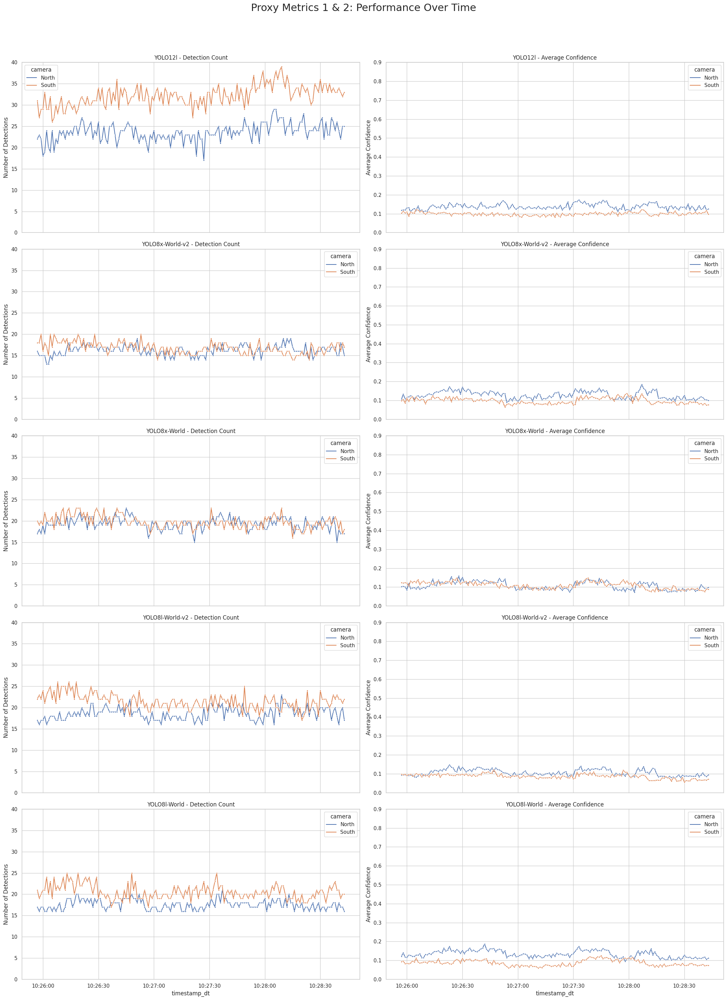

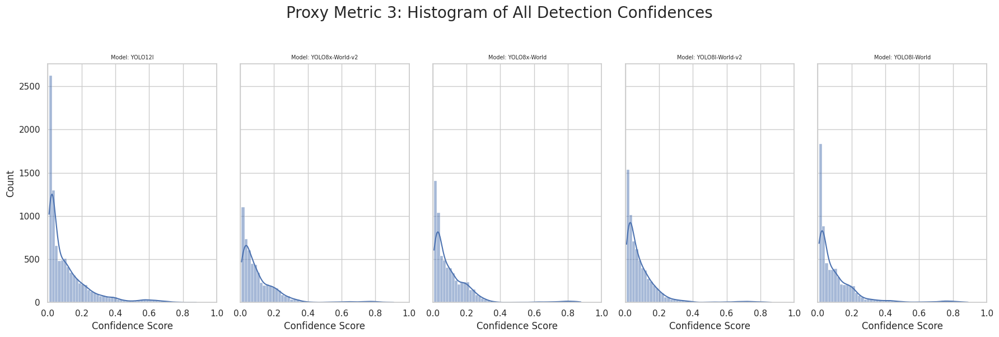

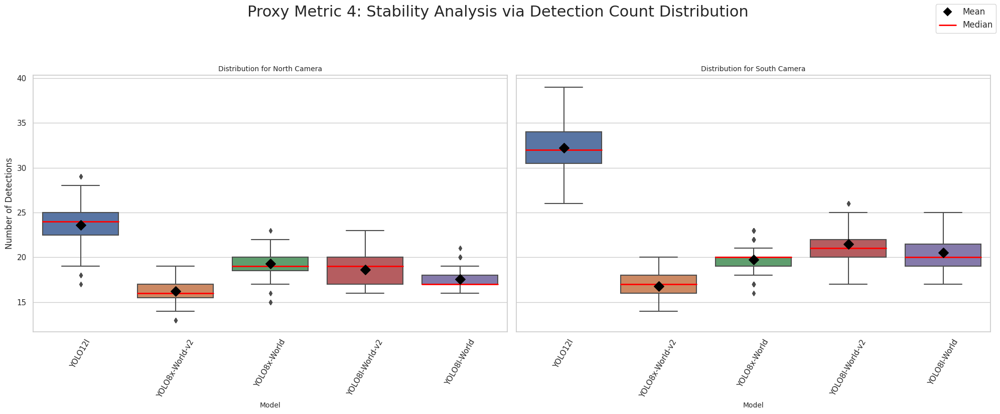


--- All Plots Generated ---

--- Generating Quantitative Validation Plots ---


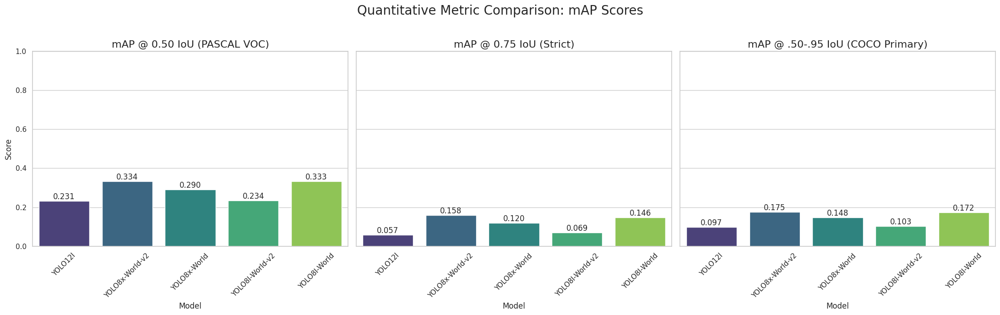

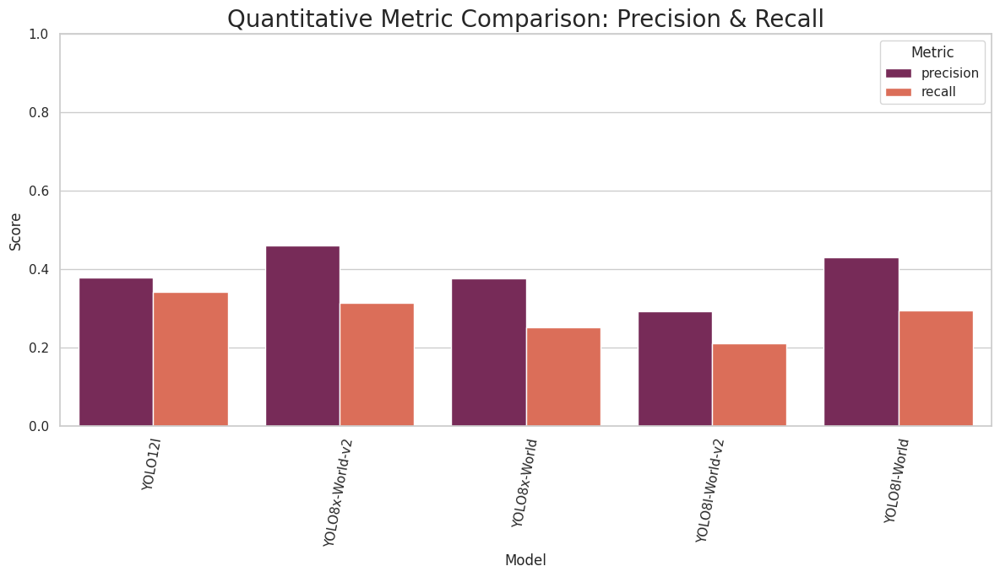

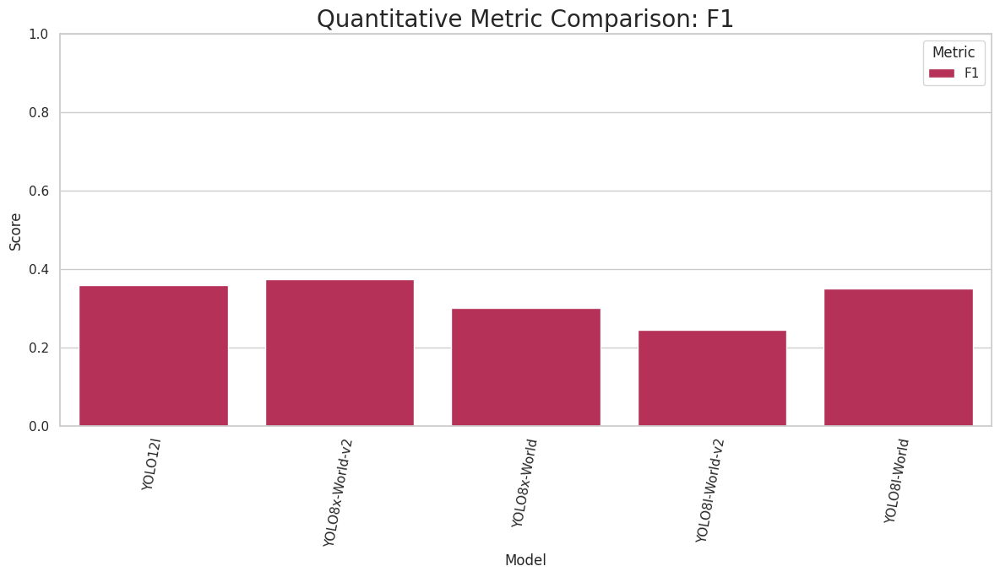

In [6]:
config_finish = FinalExperimentConfig()

proxy_results_df_finish, final_validation_df_finish = examine_models(config_finish)

# Task 3.2

## See the problem

Starting Marina Stereo Vision Data Analysis...
Found 167 images in North camera
Found 167 images in South camera

North Camera 1 - 20250203 102815:
  Valid depth pixels: 348,002 / 921,600 (37.8%)
  Depth range: 8.4m to 40.0m
  Mean depth: 17.6m



North Camera 2 - 20250203 102602:
  Valid depth pixels: 136,521 / 921,600 (14.8%)
  Depth range: 2.3m to 40.0m
  Mean depth: 13.8m

South Camera 1 - 20250203 102826:
  Valid depth pixels: 297,091 / 921,600 (32.2%)
  Depth range: 5.8m to 35.0m
  Mean depth: 17.2m

South Camera 2 - 20250203 102616:
  Valid depth pixels: 186,470 / 921,600 (20.2%)
  Depth range: 1.3m to 35.0m
  Mean depth: 17.0m


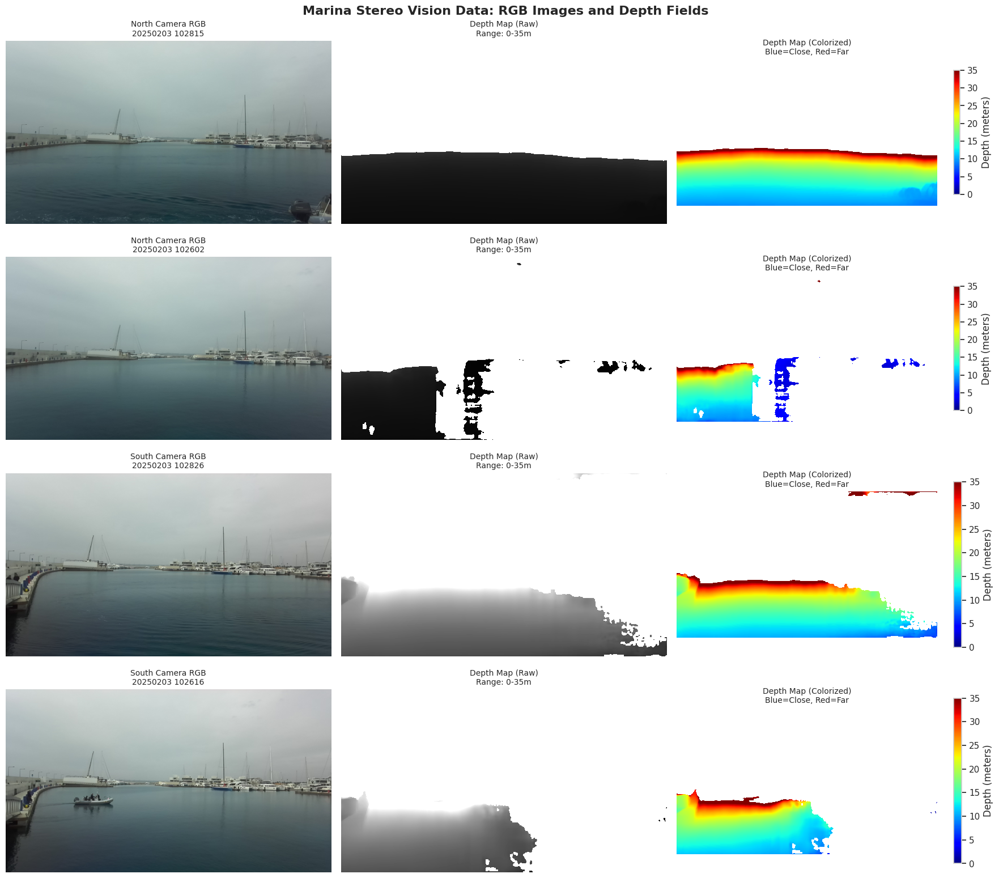


EXAMINING YOUR DETECTION RESULTS
North camera detections: 167 frames processed
South camera detections: 167 frames processed

Sample North detection structure:
Keys: ['timestamp', 'detections']

Sample South detection structure:
Keys: ['timestamp', 'detections']

Finish


In [64]:
from PIL import Image

def load_and_visualize_marina_data(image_dir: str = "/kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data",
                                   npy_dir: str = "/kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data"):
    """
    Load random images from North and South cameras and visualize them with their depth maps.
    This helps us understand the stereo vision data structure and depth field characteristics.
    """
    
    # Define the image data directory path
    north_dir_rgb = os.path.join(image_dir, "North")
    south_dir_rgb = os.path.join(image_dir, "South")

    # Define the npy data directory path
    north_dir_npy = os.path.join(npy_dir, "North")
    south_dir_npy = os.path.join(npy_dir, "South")

    
    
    # Get list of PNG files from both directories
    north_png_files = [f for f in os.listdir(north_dir_rgb) if f.endswith('.png')]
    south_png_files = [f for f in os.listdir(south_dir_rgb) if f.endswith('.png')]
    
    print(f"Found {len(north_png_files)} images in North camera")
    print(f"Found {len(south_png_files)} images in South camera")
    
    # Randomly select 2 images from each camera
    selected_north = random.sample(north_png_files, 2)
    selected_south = random.sample(south_png_files, 2)
    
    # Create a figure with subplots for visualization
    # 4 rows (2 for each camera) and 3 columns (RGB, Depth, Depth Colorized)
    fig, axes = plt.subplots(4, 3, figsize=(18, 16))
    fig.suptitle('Marina Stereo Vision Data: RGB Images and Depth Fields', fontsize=16, fontweight='bold')
    
    # Process North camera images
    for i, png_file in enumerate(selected_north):
        # Load RGB image
        rgb_path = os.path.join(north_dir_rgb, png_file)
        rgb_image = Image.open(rgb_path)
        rgb_array = np.array(rgb_image)
        
        # Load corresponding depth map
        # The depth file has the same name but with .npy extension
        depth_file = png_file.replace('.png', '.npy')
        depth_path = os.path.join(north_dir_npy, depth_file)
        depth_map = np.load(depth_path)
        
        # Extract timestamp from filename for display
        timestamp = png_file.replace('.png', '').replace('_', ' ')
        
        # Display RGB image
        axes[i, 0].imshow(rgb_array)
        axes[i, 0].set_title(f'North Camera RGB\n{timestamp}', fontsize=10)
        axes[i, 0].axis('off')
        
        # Display raw depth map (grayscale)
        # We need to handle NaN values which appear where depth couldn't be computed
        depth_display = depth_map.copy()
        
        # Convert millimeters to meters for easier interpretation
        depth_display = depth_display / 1000.0
        
        # Create a mask for valid depth values (not NaN and within reasonable range)
        valid_mask = ~np.isnan(depth_display) & (depth_display > 0) & (depth_display < 50)
        
        # Display raw depth as grayscale
        axes[i, 1].imshow(depth_display, cmap='gray', vmin=0, vmax=200)
        axes[i, 1].set_title(f'Depth Map (Raw)\nRange: 0-35m', fontsize=10)
        axes[i, 1].axis('off')
        
        # Display colorized depth map for better interpretation
        # Use a colormap that makes depth differences more visible
        depth_colorized = axes[i, 2].imshow(depth_display, cmap='jet', vmin=0, vmax=35)
        axes[i, 2].set_title(f'Depth Map (Colorized)\nBlue=Close, Red=Far', fontsize=10)
        axes[i, 2].axis('off')
        
        # Add colorbar for the colorized depth map
        plt.colorbar(depth_colorized, ax=axes[i, 2], shrink=0.6, label='Depth (meters)')
        
        # Print some statistics about this depth map
        valid_depths = depth_display[valid_mask]
        if len(valid_depths) > 0:
            print(f"\nNorth Camera {i+1} - {timestamp}:")
            print(f"  Valid depth pixels: {len(valid_depths):,} / {depth_display.size:,} ({100*len(valid_depths)/depth_display.size:.1f}%)")
            print(f"  Depth range: {valid_depths.min():.1f}m to {valid_depths.max():.1f}m")
            print(f"  Mean depth: {valid_depths.mean():.1f}m")
    
    # Process South camera images (same process as North)
    for i, png_file in enumerate(selected_south):
        row_idx = i + 2  # South camera images go in rows 2 and 3
        
        # Load RGB image
        rgb_path = os.path.join(south_dir_rgb, png_file)
        rgb_image = Image.open(rgb_path)
        rgb_array = np.array(rgb_image)
        
        # Load corresponding depth map
        depth_file = png_file.replace('.png', '.npy')
        depth_path = os.path.join(south_dir_npy, depth_file)
        depth_map = np.load(depth_path)
        
        # Extract timestamp from filename
        timestamp = png_file.replace('.png', '').replace('_', ' ')
        
        # Display RGB image
        axes[row_idx, 0].imshow(rgb_array)
        axes[row_idx, 0].set_title(f'South Camera RGB\n{timestamp}', fontsize=10)
        axes[row_idx, 0].axis('off')
        
        # Process and display depth map
        depth_display = depth_map.copy() / 1000.0  # Convert to meters
        valid_mask = ~np.isnan(depth_display) & (depth_display > 0) & (depth_display < 35)
        
        # Raw depth map
        axes[row_idx, 1].imshow(depth_display, cmap='gray', vmin=0, vmax=35)
        axes[row_idx, 1].set_title(f'Depth Map (Raw)\nRange: 0-35m', fontsize=10)
        axes[row_idx, 1].axis('off')
        
        # Colorized depth map
        depth_colorized = axes[row_idx, 2].imshow(depth_display, cmap='jet', vmin=0, vmax=35)
        axes[row_idx, 2].set_title(f'Depth Map (Colorized)\nBlue=Close, Red=Far', fontsize=10)
        axes[row_idx, 2].axis('off')
        
        # Add colorbar
        plt.colorbar(depth_colorized, ax=axes[row_idx, 2], shrink=0.8, label='Depth (meters)')
        
        # Print statistics
        valid_depths = depth_display[valid_mask]
        if len(valid_depths) > 0:
            print(f"\nSouth Camera {i+1} - {timestamp}:")
            print(f"  Valid depth pixels: {len(valid_depths):,} / {depth_display.size:,} ({100*len(valid_depths)/depth_display.size:.1f}%)")
            print(f"  Depth range: {valid_depths.min():.1f}m to {valid_depths.max():.1f}m")
            print(f"  Mean depth: {valid_depths.mean():.1f}m")
    

    plt.tight_layout()
    plt.savefig('/kaggle/working/marina_depth_visualization.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # Let's also examine the detection results
    print("\n" + "="*60)
    print("EXAMINING YOUR DETECTION RESULTS")
    print("="*60)
    
    try:
        # Load and examine the detection files you created
        with open('/kaggle/working/detections_cam_North.json', 'r') as f:
            north_detections = json.load(f)
        
        with open('/kaggle/working/detections_cam_South.json', 'r') as f:
            south_detections = json.load(f)
        
        print(f"North camera detections: {len(north_detections)} frames processed")
        print(f"South camera detections: {len(south_detections)} frames processed")
        
        # Examine structure of first detection
        if north_detections:
            print(f"\nSample North detection structure:")
            print(f"Keys: {list(north_detections[0].keys())}")
            
        if south_detections:
            print(f"\nSample South detection structure:")
            print(f"Keys: {list(south_detections[0].keys())}")
            
    except FileNotFoundError as e:
        print(f"Detection files not found: {e}")
        print("This is expected if you haven't run the detection step yet.")

  
print("Starting Marina Stereo Vision Data Analysis...")
print("="*60)
    
# Run the main visualization
load_and_visualize_marina_data()
    
print(f"\nFinish")

It is clear that there are a lot "bad" pixel in ground truth depth field (distance less then 35 meters)

## Solve the problem with bad pixels in ground truth depth field zone

It can be done by several approaches. One of the possible approaches comprises spatially inpainting each depth frame (using OpenCV’s Telea inpainting over a NaN mask) and temporal smoothing the resulting volume with an exponential moving average 

In [7]:
# ---------------------------------------------------------------
# 1) helper constants
# ---------------------------------------------------------------
MAX_DEPTH_MM = 35_000          # 35 m expressed in millimetres

# ---------------------------------------------------------------
# 2) depth‑aware spatial in‑paint
#    • only fills NaNs INSIDE ≤ 35 m
#    • leaves > 35 m untouched
# ---------------------------------------------------------------
def spatial_inpaint_8bit(depth_mm, max_depth_mm=MAX_DEPTH_MM):
    """
    Inpaint NaNs for depths ≤ max_depth_mm; 
    keeps the far field unchanged.
    """
    # mask of pixels we are *allowed* to repair - region with distances < 35 meters
    roi = (depth_mm <= max_depth_mm)

    # "holes" we want to fill = NaN *inside* the ROI
    hole_mask = np.isnan(depth_mm) & roi
    if not hole_mask.any():
        return depth_mm.astype(np.float32, copy=False)  # nothing to fix

    # statistics only over valid depths INSIDE the ROI
    valid_roi = depth_mm[roi & ~np.isnan(depth_mm)]
    if valid_roi.size == 0:            # pathological – no valid data inside 35 m
        return depth_mm.astype(np.float32, copy=False)

    minv, maxv = valid_roi.min(), valid_roi.max()
    if maxv - minv < 1e-3:             # dynamic range collapsed
        return depth_mm.astype(np.float32, copy=False)

    # ---- prepare for OpenCV in‑paint ----------------------------------------
    depth_u8  = np.zeros_like(depth_mm, np.uint8)
    sel       = roi & ~np.isnan(depth_mm)
    depth_u8[sel] = np.clip((depth_mm[sel] - minv) / (maxv - minv) * 255,
                            0, 255).astype(np.uint8)

    mask_u8 = (hole_mask.astype(np.uint8)) * 255  # 0/255 mask as OpenCV wants
    depth_u8_filled = cv2.inpaint(depth_u8, mask_u8, 3, cv2.INPAINT_TELEA)

    # ---- back to millimetres ----------------------------------------
    depth_filled = depth_mm.copy().astype(np.float32)
    restored_mm  = depth_u8_filled.astype(np.float32) / 255 * (maxv - minv) + minv
    depth_filled[hole_mask] = restored_mm[hole_mask]  # only overwrite holes
    return depth_filled

# ------------------------------------------------------------------
# float‑32 version of the "prepare‑for‑OpenCV" stage
# ------------------------------------------------------------------
def spatial_inpaint_float32(depth_mm, max_depth_mm=MAX_DEPTH_MM):
    """
    Inpaint NaNs *inside* the ≤ 35 m band using cv2.inpaint on a
    NORMALISED float32 image (0…1).  Leaves > 35 m untouched.
    """
    roi        = (depth_mm <= max_depth_mm)
    hole_mask  = np.isnan(depth_mm) & roi          # pixels we’re allowed to fill
    if not hole_mask.any():
        return depth_mm.astype(np.float32, copy=False)

    # ---- stats over valid depths inside ROI ---------------------------------
    valid_roi  = depth_mm[roi & ~np.isnan(depth_mm)]
    if valid_roi.size == 0:
        return depth_mm.astype(np.float32, copy=False)

    minv, maxv = valid_roi.min(), valid_roi.max()
    if maxv - minv < 1e-3:                         # degenerate band
        return depth_mm.astype(np.float32, copy=False)

    # ---- build float32 image in [0,1] ---------------------------------------
    depth_f32  = np.zeros_like(depth_mm, np.float32)
    sel        = roi & ~np.isnan(depth_mm)         # good pixels inside ROI
    depth_f32[sel] = (depth_mm[sel] - minv) / (maxv - minv)

    # ---- binary mask for OpenCV ---------------------------------------------
    mask_u8    = (hole_mask.astype(np.uint8)) * 255   # 0 / 255

    # ---- Telea in‑painting on float32 image ---------------------------------
    depth_f32_filled = cv2.inpaint(depth_f32, 
                                   mask_u8,
                                   inpaintRadius=4, 
                                   flags=cv2.INPAINT_NS)

    # ---- back‑project to millimetres ----------------------------------------
    depth_filled          = depth_mm.copy().astype(np.float32)
    depth_filled[hole_mask] = (depth_f32_filled[hole_mask] *
                               (maxv - minv) + minv)
    return depth_filled

# ---------------------------------------------------------------
# 3) NaN‑aware EMA restricted to the ROI
# ---------------------------------------------------------------
def ema_nan_aware(prev, curr, alpha, max_depth_mm=MAX_DEPTH_MM):
    """
    Exponential moving average only for pixels ≤ max_depth_mm.
    Far‑field (> 35 m) is copied unchanged (or stays NaN).
    """
    inside = (prev <= max_depth_mm) | (curr <= max_depth_mm)
    # normal EMA where both inside & both valid
    both_valid = inside & ~np.isnan(prev) & ~np.isnan(curr)

    out = prev.copy()
    out[both_valid] = alpha * curr[both_valid] + (1 - alpha) * prev[both_valid]

    # cases where exactly one is valid inside ROI
    prev_only = inside & ~np.isnan(prev) &  np.isnan(curr)
    curr_only = inside &  np.isnan(prev) & ~np.isnan(curr)
    out[prev_only] = prev[prev_only]
    out[curr_only] = curr[curr_only]

    # pixels outside ROI simply keep the previous value (even NaN)
    return out

# ---------------------------------------------------------------
# 4) series‑level correction (unchanged call signature)
# ---------------------------------------------------------------
def correct_depth_series(cam_dir, output_dir, alpha=0.2):
    npy_files = sorted(f for f in os.listdir(cam_dir)
                       if f.endswith('.npy') and not f.endswith('_corrected.npy'))
    if not npy_files:
        print(f"[WARN] no raw .npy files in {cam_dir}")
        return

    os.makedirs(output_dir, exist_ok=True)
    print(f"→ {len(npy_files)} frames")

    # first frame: repair spatially, no temporal smoothing yet
    depth0     = np.load(os.path.join(cam_dir, npy_files[0]))
    smoothed   = spatial_inpaint_float32(depth0)                # dense in ROI
    np.save(os.path.join(output_dir, npy_files[0]),  smoothed)

    # remaining frames
    for fn in tqdm(npy_files[1:], unit='frame', ascii=True, leave=False):
        depth        = np.load(os.path.join(cam_dir, fn))
        depth_filled = spatial_inpaint_float32(depth)
        smoothed     = ema_nan_aware(smoothed, depth_filled, alpha)

        np.save(os.path.join(output_dir, fn), smoothed)


# ---------------------------------------------------------------
# 5) run for both cameras exactly as before
# ---------------------------------------------------------------
base_in  = "/kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data"
base_out = "/kaggle/working/corrected_depths"

print("\nStarting depth‑field correction …")
for cam in ["North", "South"]:
    print(f"\nProcessing {cam} camera:")
    correct_depth_series(os.path.join(base_in,  cam),
                         os.path.join(base_out, cam),
                         alpha=0.06)

print("\n✓ Finished")


Starting depth‑field correction …

Processing North camera:
→ 167 frames


  0%|          | 0/166 [00:00<?, ?frame/s]RuntimeWarning: invalid value encountered in less_equal



Processing South camera:
→ 167 frames



✓ Finished


In [66]:
import os, random, json
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def load_and_compare_depth_fields(
    image_dir      = "/kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data",
    initial_npy_dir= "/kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data",
    corrected_npy_dir = "/kaggle/working/corrected_depths",
    vmax_m = 35
):
    random.seed(2)
    np.random.seed(2)
    # folders ---------------------------------------------------------------
    north_png = os.path.join(image_dir, "North")
    south_png = os.path.join(image_dir, "South")

    north_npy_init = os.path.join(initial_npy_dir, "North")
    south_npy_init = os.path.join(initial_npy_dir, "South")

    north_npy_corr = os.path.join(corrected_npy_dir, "North")
    south_npy_corr = os.path.join(corrected_npy_dir, "South")

    # file lists ------------------------------------------------------------
    n_png = [f for f in os.listdir(north_png) if f.endswith(".png")]
    s_png = [f for f in os.listdir(south_png) if f.endswith(".png")]

    print(f"North PNG: {len(n_png)}    South PNG: {len(s_png)}")

    sel_n = random.sample(n_png,  min(2, len(n_png)))
    sel_s = random.sample(s_png,  min(2, len(s_png)))

    # figure ----------------------------------------------------------------
    rows = len(sel_n) + len(sel_s)
    fig, axes = plt.subplots(rows, 3, figsize=(18, 4*rows))
    fig.suptitle("Initial vs Corrected Depth (≤35 m band)", fontsize=16, weight='bold')

    def _plot(row, cam_label, png_file, rgb_root, init_root, corr_root):
        rgb   = np.array(Image.open(os.path.join(rgb_root, png_file)))

        base  = png_file.replace(".png", "")
        npy_init = os.path.join(init_root, base + ".npy")
        npy_corr = os.path.join(corr_root, base + ".npy")

        d0 = np.load(npy_init)   / 1000.0      # m
        d1 = np.load(npy_corr)   / 1000.0

        # mask NaNs for nicer display
        d0 = np.ma.masked_invalid(d0)
        d1 = np.ma.masked_invalid(d1)

        axes[row,0].imshow(rgb)
        axes[row,0].set_title(f"{cam_label} RGB\n{base}")
        axes[row,0].axis("off")

        im0 = axes[row,1].imshow(d0, cmap='jet', vmin=0, vmax=vmax_m)
        axes[row,1].set_title("INITIAL depth (m)")
        axes[row,1].axis("off")

        im1 = axes[row,2].imshow(d1, cmap='jet', vmin=0, vmax=vmax_m)
        axes[row,2].set_title("CORRECTED depth (m)")
        axes[row,2].axis("off")

    # North rows first
    for r, fn in enumerate(sel_n):
        _plot(r, "North", fn, north_png, north_npy_init, north_npy_corr)

    # South rows
    for r, fn in enumerate(sel_s, start=len(sel_n)):
        _plot(r, "South", fn, south_png, south_npy_init, south_npy_corr)

    plt.tight_layout()
    plt.show()
    fig.savefig("/kaggle/working/marina_depth_visualization_init_and_corrected.png",
                dpi=150, bbox_inches="tight")

North PNG: 167    South PNG: 167


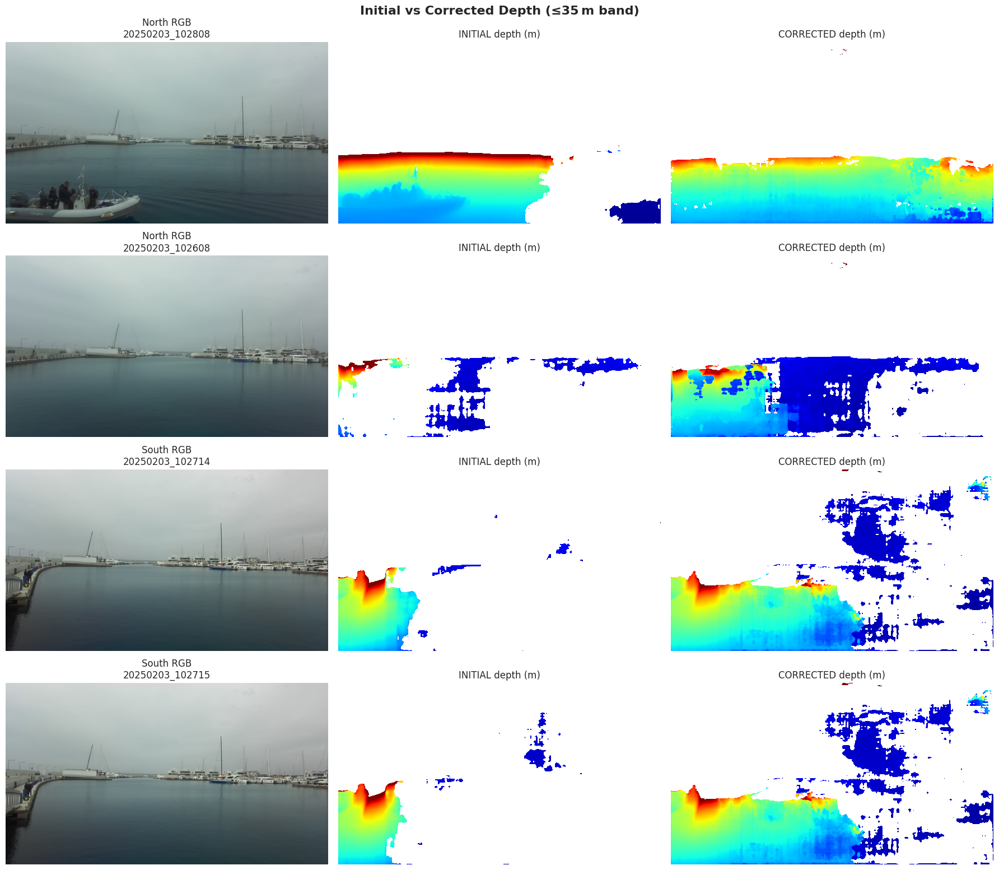

In [67]:
load_and_compare_depth_fields()

## Segmentation sky and water

Before we go the next step of generation depth field let us note that there are two main regions on out images – sky and water. So calculation depth field for pixels related to sky region seems unvaluable because we can just assign to the maximum distance, for instance 1000 meters. So in order the reveal pixels related to sky region we can use segmentation. Let us see how it can be done

100%|██████████| 154M/154M [00:04<00:00, 34.6MB/s] 



0: 1024x1024 1 0, 1 1, 1 2, 1 3, 1 4, 1 5, 5457.1ms
Speed: 80.9ms preprocess, 5457.1ms inference, 2.0ms postprocess per image at shape (1, 3, 1024, 1024)


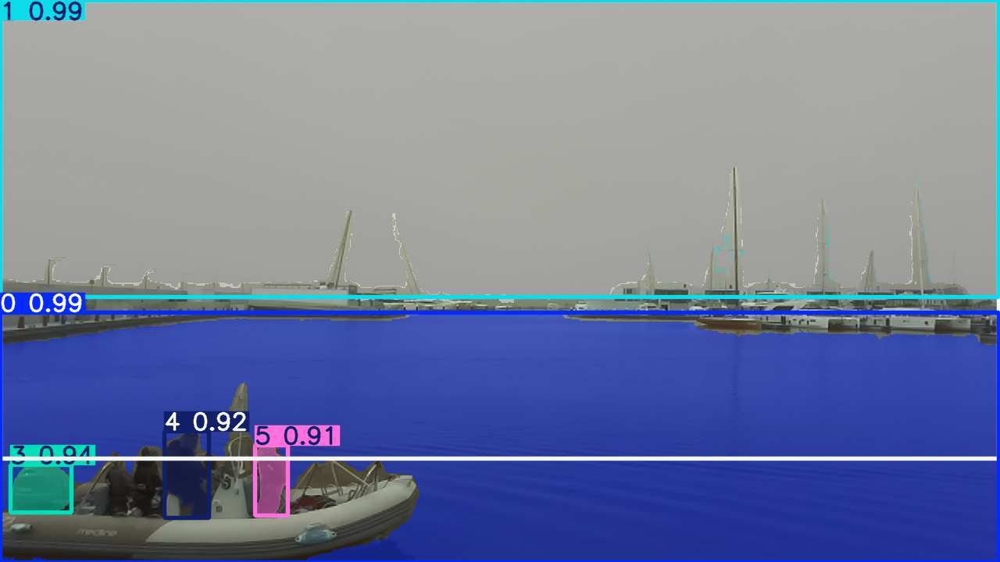

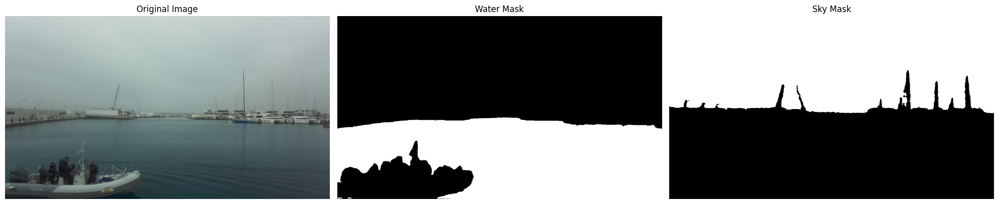

Sky pixels count: 458375
Water pixels count: 319900


In [53]:
# Initialize SAM model (from Ultralytics)
sam_model = SAM('sam2.1_b.pt') 

# Define paths
data_dir = "/kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data"
north_dir = os.path.join(data_dir, "North")

# Select one random image for demonstration
random.seed(2)
north_images = [f for f in os.listdir(north_dir) if f.endswith('.png')]
selected_image_name = random.choice(north_images)

# Load the selected image
image_path = os.path.join(north_dir, selected_image_name)
rgb_image = Image.open(image_path)
rgb_array = np.array(rgb_image)

# Perform segmentation with SAM
results = sam_model(rgb_array)
results[0].show()


# Extract masks and classes (object ids)
masks = results[0].masks.data.cpu().numpy()  # shape: [N, H, W]

# Let's assume from your visualization:
# masks[0] - water
# masks[1] - sky
water_mask = masks[0].astype(bool)
sky_mask = masks[1].astype(bool)

# Verify and visualize masks
fig, axes = plt.subplots(1, 3, figsize=(20, 8))

# Original RGB
axes[0].imshow(rgb_array)
axes[0].set_title("Original Image")
axes[0].axis('off')

# Water Mask
axes[1].imshow(water_mask, cmap='gray')
axes[1].set_title("Water Mask")
axes[1].axis('off')

# Sky Mask
axes[2].imshow(sky_mask, cmap='gray')
axes[2].set_title("Sky Mask")
axes[2].axis('off')

plt.tight_layout()
plt.show()

# Accessing pixels:
# Get pixel coordinates belonging to sky
sky_coords = np.argwhere(sky_mask)
print(f"Sky pixels count: {len(sky_coords)}")

# Get pixel coordinates belonging to water
water_coords = np.argwhere(water_mask)
print(f"Water pixels count: {len(water_coords)}")

## Prediction of the relative depth field: compare DPT and MDE models for prediction relative depth field

Device set to use cuda
Some weights of DPTForDepthEstimation were not initialized from the model checkpoint at Intel/dpt-large and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.convolution1.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Device set to use cuda


Starting Comprehensive Depth Analysis including Intermediate Steps...
Found 167 images in North camera

0: 1024x1024 1 0, 1 1, 1 2, 4700.9ms
Speed: 5.4ms preprocess, 4700.9ms inference, 0.5ms postprocess per image at shape (1, 3, 1024, 1024)


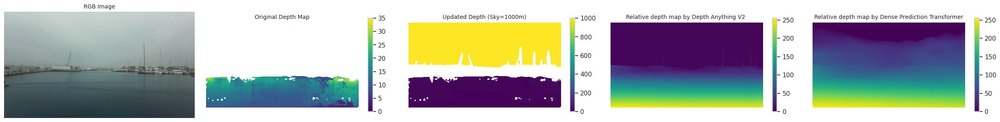


0: 1024x1024 1 0, 1 1, 4687.1ms
Speed: 5.0ms preprocess, 4687.1ms inference, 0.4ms postprocess per image at shape (1, 3, 1024, 1024)


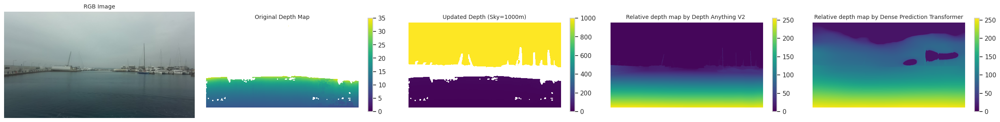


0: 1024x1024 1 0, 1 1, 1 2, 4692.3ms
Speed: 5.0ms preprocess, 4692.3ms inference, 0.4ms postprocess per image at shape (1, 3, 1024, 1024)


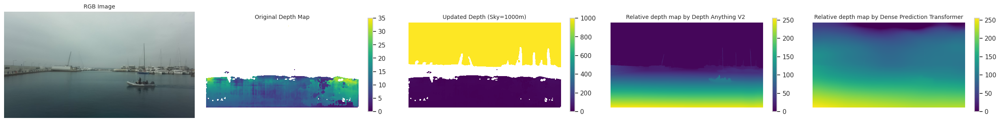


0: 1024x1024 1 0, 1 1, 1 2, 4682.1ms
Speed: 5.1ms preprocess, 4682.1ms inference, 0.4ms postprocess per image at shape (1, 3, 1024, 1024)


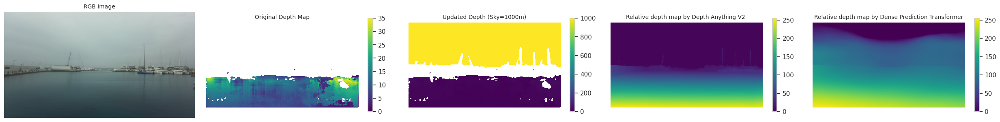


0: 1024x1024 1 0, 1 1, 4686.4ms
Speed: 4.9ms preprocess, 4686.4ms inference, 0.4ms postprocess per image at shape (1, 3, 1024, 1024)


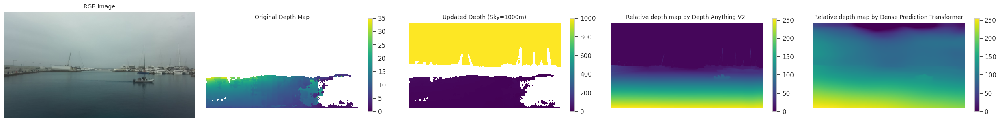


0: 1024x1024 1 0, 1 1, 4689.6ms
Speed: 5.3ms preprocess, 4689.6ms inference, 0.4ms postprocess per image at shape (1, 3, 1024, 1024)


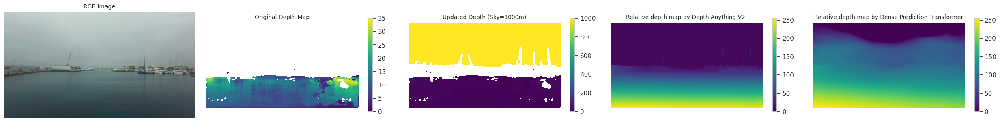

In [77]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from ultralytics import SAM
import torch
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from transformers import DPTFeatureExtractor, DPTForDepthEstimation, pipeline

# Initialize SAM model
sam_model = SAM('sam2.1_b.pt')

checkpoint_Depth_Anything_V2 = "depth-anything/Depth-Anything-V2-Large-hf"
checkpoint_intel = "Intel/dpt-large"

device, _, _ = get_backend()
depth_pipeline_MDE = pipeline('depth-estimation', model=checkpoint_Depth_Anything_V2, device=device)
depth_pipeline_DPT = pipeline('depth-estimation', model=checkpoint_intel, device=device)

def predict_and_show_relative_depth_field():
    """
    Visualization including intermediate relative depth estimations.
    """
    data_dir = "/kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data"
    corrected_npy_dir = "/kaggle/working/corrected_depths"
    north_dir_rgb = os.path.join(data_dir, "North")
    north_dir_npy = os.path.join(corrected_npy_dir, "North")

    north_png_files = [f for f in os.listdir(north_dir) if f.endswith('.png')]
    print(f"Found {len(north_png_files)} images in North camera")

    selected_north = random.sample(north_png_files, 6)


    for i, png_file in enumerate(selected_north):
        
        # Load image and depth
        rgb_path = os.path.join(north_dir, png_file)
        rgb_image = Image.open(rgb_path)
        rgb_array = np.array(rgb_image)

        depth_file = png_file.replace('.png', '.npy')
        depth_map = np.load(os.path.join(north_dir_npy, depth_file)) / 1000.0 # millimeters -> meters

        # SAM segmentation
        results = sam_model(rgb_array)
        masks = results[0].masks.data.cpu().numpy()
        sky_mask = masks[1].astype(bool)

        distance_for_sky_pixels = 1000
        updated_depth_map = np.where(sky_mask, distance_for_sky_pixels, depth_map)

        # Monocular depth predictions
        predictions_MDE = depth_pipeline_MDE(rgb_image)
        predictions_DPT = depth_pipeline_DPT(rgb_image)

        mono_MDE = predictions_MDE["depth"]
        mono_DPT = predictions_DPT["depth"]

        # Visualization
        # Display RGB image
        fig, axes = plt.subplots(1, 5, figsize=(25, 5))

        # Display RGB Image
        axes[0].imshow(rgb_array)
        axes[0].set_title('RGB Image', fontsize=10)
        axes[0].axis('off')
        
        # Display Original Depth Map
        im1 = axes[1].imshow(depth_map, cmap='viridis', vmin=0, vmax=35)
        axes[1].set_title('Original Depth Map', fontsize=10)
        axes[1].axis('off')
        fig.colorbar(im1, ax=axes[1], shrink=0.5)
        
        # Display Updated Depth Map
        im2 = axes[2].imshow(updated_depth_map, cmap='viridis', vmin=0, vmax=distance_for_sky_pixels)
        axes[2].set_title(f'Updated Depth (Sky={distance_for_sky_pixels}m)', fontsize=10)
        axes[2].axis('off')
        fig.colorbar(im2, ax=axes[2], shrink=0.5)
        
        # Display Relative depth map by MDE
        im3 = axes[3].imshow(mono_MDE, cmap='viridis')
        axes[3].set_title('Relative depth map by Depth Anything V2 ', fontsize=10)
        axes[3].axis('off')
        fig.colorbar(im3, ax=axes[3], shrink=0.5)
        
        # Display Relative depth map by DPT
        im4 = axes[4].imshow(mono_DPT, cmap='viridis')
        axes[4].set_title('Relative depth map by Dense Prediction Transformer', fontsize=10)
        axes[4].axis('off')
        fig.colorbar(im4, ax=axes[4], shrink=0.5)
        
        # Adjust layout to prevent titles from overlapping and display the plot
        plt.tight_layout()
        plt.show()

random.seed(3)
np.random.seed(3)

print("Starting Comprehensive Depth Analysis including Intermediate Steps...")
print("="*60)

predict_and_show_relative_depth_field()

## A per-image calibration of predicted depth field with Ground Truth

Device set to use cuda


Found 167 images in North camera

0: 1024x1024 1 0, 1 1, 1 2, 4705.6ms
Speed: 5.9ms preprocess, 4705.6ms inference, 0.4ms postprocess per image at shape (1, 3, 1024, 1024)


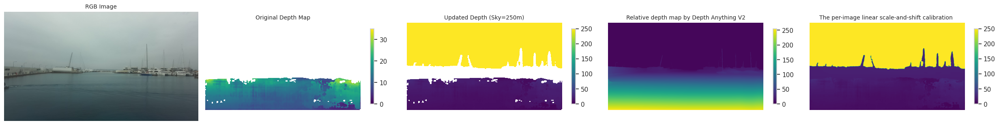


0: 1024x1024 1 0, 1 1, 4694.3ms
Speed: 5.2ms preprocess, 4694.3ms inference, 0.4ms postprocess per image at shape (1, 3, 1024, 1024)


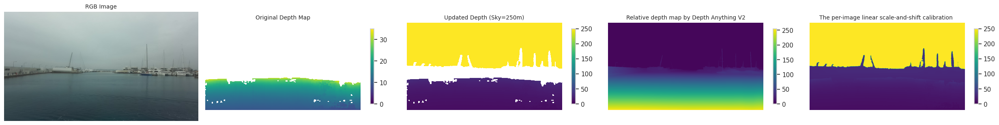


0: 1024x1024 1 0, 1 1, 1 2, 4703.2ms
Speed: 5.1ms preprocess, 4703.2ms inference, 0.6ms postprocess per image at shape (1, 3, 1024, 1024)


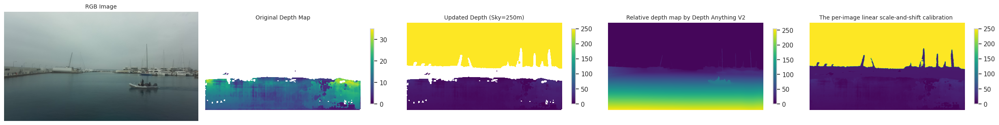


0: 1024x1024 1 0, 1 1, 1 2, 4693.9ms
Speed: 5.1ms preprocess, 4693.9ms inference, 0.4ms postprocess per image at shape (1, 3, 1024, 1024)


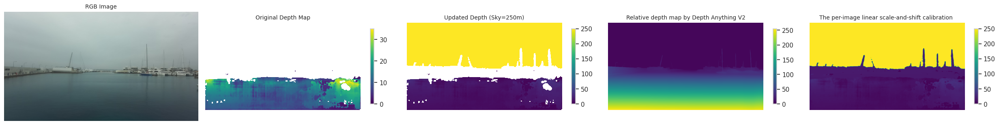


0: 1024x1024 1 0, 1 1, 4696.4ms
Speed: 5.0ms preprocess, 4696.4ms inference, 0.4ms postprocess per image at shape (1, 3, 1024, 1024)


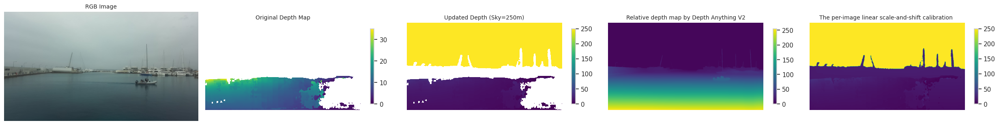

In [89]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from ultralytics import SAM
import torch
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from transformers import DPTFeatureExtractor, DPTForDepthEstimation, pipeline

# Initialize SAM model
sam_model = SAM('sam2.1_b.pt')

device, _, _ = get_backend()
checkpoint_Depth_Anything_V2 = "depth-anything/Depth-Anything-V2-Large-hf"

depth_pipeline_Depth_Anything_V2 = pipeline('depth-estimation', model=checkpoint_Depth_Anything_V2, device=device)

def predict_calibrate_per_image_and_show_relative_depth_field():

    data_dir = "/kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data"
    corrected_npy_dir = "/kaggle/working/corrected_depths"
    north_dir_rgb = os.path.join(data_dir, "North")
    north_dir_npy = os.path.join(corrected_npy_dir, "North")

    north_png_files = [f for f in os.listdir(north_dir) if f.endswith('.png')]
    print(f"Found {len(north_png_files)} images in North camera")

    selected_north = random.sample(north_png_files, 5)


    for i, png_file in enumerate(selected_north):
        
        # Load image and depth
        rgb_path = os.path.join(north_dir, png_file)
        rgb_image = Image.open(rgb_path)
        rgb_array = np.array(rgb_image)

        depth_file = png_file.replace('.png', '.npy')
        depth_map = np.load(os.path.join(north_dir_npy, depth_file)) / 1000.0 # millimeters -> meters

        # SAM segmentation
        results = sam_model(rgb_array)
        masks = results[0].masks.data.cpu().numpy()
        sky_mask = masks[1].astype(bool)

        distance_for_sky_pixels = 250
        updated_depth_map = np.where(sky_mask, distance_for_sky_pixels, depth_map)

        # Monocular depth predictions
        predictions_MDE = depth_pipeline_Depth_Anything_V2(rgb_image)
        mono_MDE = predictions_MDE["depth"]
        mono_MDE_numpy = np.array(mono_MDE)

        # Stereo Calibration
        valid_mask = ~np.isnan(depth_map) & (depth_map > 2) & (depth_map < 35)
        scale_MDE, offset_MDE = np.polyfit(mono_MDE_numpy[valid_mask], depth_map[valid_mask], 1)

        calibrated_MDE = mono_MDE_numpy * scale_MDE + offset_MDE

        final_MDE = np.where(valid_mask, depth_map, calibrated_MDE)
        final_MDE[sky_mask] = distance_for_sky_pixels    

        # Visualization
        # Display RGB image
       
        # Create a figure and a set of subplots in one row and 5 columns
        fig, axes = plt.subplots(1, 5, figsize=(25, 5))
        
        # Plot 1: RGB Image
        axes[0].imshow(rgb_array)
        axes[0].set_title('RGB Image', fontsize=10)
        axes[0].axis('off')
        
        # Plot 2: Original Depth Map
        im1 = axes[1].imshow(depth_map, cmap='viridis', vmin=0, vmax=35)
        axes[1].set_title('Original Depth Map', fontsize=10)
        axes[1].axis('off')
        fig.colorbar(im1, ax=axes[1], shrink=0.4)
        
        # Plot 3: Updated Depth Map
        im2 = axes[2].imshow(updated_depth_map, cmap='viridis', vmin=0, vmax=distance_for_sky_pixels)
        axes[2].set_title(f'Updated Depth (Sky={distance_for_sky_pixels}m)', fontsize=10)
        axes[2].axis('off')
        fig.colorbar(im2, ax=axes[2], shrink=0.4)
        
        # Plot 4: Relative depth map by MDE
        im3 = axes[3].imshow(mono_MDE, cmap='viridis')
        axes[3].set_title('Relative depth map by Depth Anything V2', fontsize=10)
        axes[3].axis('off')
        fig.colorbar(im3, ax=axes[3], shrink=0.4)
        
        # Plot 5: Calibrated depth map by MDE
        im4 = axes[4].imshow(final_MDE, cmap='viridis', vmin=0, vmax=distance_for_sky_pixels)
        axes[4].set_title('The per-image linear scale-and-shift calibration ', fontsize=10)
        axes[4].axis('off')
        fig.colorbar(im4, ax=axes[4], shrink=0.4)
        
        plt.tight_layout()        
        plt.show()

random.seed(3)
np.random.seed(3)

print("="*60)

predict_calibrate_per_image_and_show_relative_depth_field()

### Global calibrations of predicted depth field with Ground Truth

Moving to a global calibration is a great way to improve the temporal stability and consistency of your depth predictions. A per-image calibration can sometimes introduce slight "flickering" in the depth scale between frames if the available ground truth changes. A global calibration smooths this out by finding a single, robust mapping for the entire sequence.

Initializing models...


100%|██████████| 154M/154M [00:00<00:00, 180MB/s] 


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.34G [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/775 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
Device set to use cuda


Models initialized on device: cuda

--- Starting Pass 1: Collecting data for Global Calibration from 167 samples ---


Collected 49823702 valid data points for calibration.
Global Calibration Complete: Scale=-0.0388, Offset=19.2146

--- Starting Pass 2: Applying Global Calibration and Visualizing Results ---

0: 1024x1024 1 0, 1 1, 4893.4ms
Speed: 6.3ms preprocess, 4893.4ms inference, 0.5ms postprocess per image at shape (1, 3, 1024, 1024)


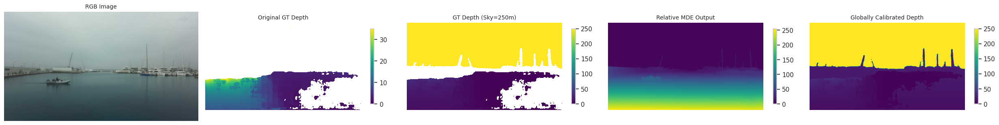

In [8]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from ultralytics import SAM
import torch
from transformers import pipeline
from tqdm import tqdm # For progress bars

# --- 1. INITIALIZATION ---
# It's good practice to put initialization outside the main function
print("Initializing models...")
sam_model = SAM('sam2.1_b.pt')
device = 'cuda' if torch.cuda.is_available() else 'cpu'
checkpoint_Depth_Anything_V2 = "depth-anything/Depth-Anything-V2-Large-hf"
depth_pipeline_Depth_Anything_V2 = pipeline('depth-estimation', model=checkpoint_Depth_Anything_V2, device=device)
print(f"Models initialized on device: {device}")

# --- 2. GLOBAL CALIBRATION FUNCTION ---
def get_global_calibration_factors(data_dir, num_samples=100):
    """
    Pass 1: Collect data from a sample of frames to compute global scale and offset.
    """
    print(f"\n--- Starting Pass 1: Collecting data for Global Calibration from {num_samples} samples ---")
    
    north_dir_rgb = os.path.join(data_dir, "North")
    north_dir_npy_corrected = os.path.join("/kaggle/working/corrected_depths", "North")

    all_png_files = [f for f in os.listdir(north_dir_rgb) if f.endswith('.png')]
    
    sample_files = random.sample(all_png_files, min(num_samples, len(all_png_files)))
    
    all_mono_values = []
    all_stereo_values = []

    for png_file in tqdm(sample_files, desc="Collecting calibration data"):
        # Load image and depth
        rgb_path = os.path.join(north_dir_rgb, png_file)
        rgb_image = Image.open(rgb_path)
        
        depth_file = png_file.replace('.png', '.npy')
        gt_depth_path = os.path.join(north_dir_npy_corrected, depth_file)
        
        if not os.path.exists(gt_depth_path):
            continue
            
        stereo_depth_map = np.load(gt_depth_path) / 1000.0 # meters

        # Get monocular prediction
        predictions_MDE = depth_pipeline_Depth_Anything_V2(rgb_image)
        mono_MDE_numpy = np.array(predictions_MDE["depth"])
        
        # Define the high-confidence mask for reliable ground truth points
        valid_mask = ~np.isnan(stereo_depth_map) & (stereo_depth_map > 2) & (stereo_depth_map < 35)
        
        # Append the valid, paired data points to our global lists
        all_mono_values.append(mono_MDE_numpy[valid_mask])
        all_stereo_values.append(stereo_depth_map[valid_mask])

    # Concatenate all collected data points into two large 1D arrays
    global_mono_points = np.concatenate(all_mono_values)
    global_stereo_points = np.concatenate(all_stereo_values)

    print(f"Collected {len(global_mono_points)} valid data points for calibration.")

    # Compute the single global scale and offset via linear regression
    global_scale, global_offset = np.polyfit(global_mono_points, global_stereo_points, 1)
    
    print(f"Global Calibration Complete: Scale={global_scale:.4f}, Offset={global_offset:.4f}")
    
    return global_scale, global_offset

# --- 3. MAIN PROCESSING FUNCTION ---

def predict_and_calibrate_with_global_factors(global_scale, global_offset):
    """
    Pass 2: Apply the pre-computed global calibration factors to a sample of frames and visualize.
    """
    print("\n--- Starting Pass 2: Applying Global Calibration and Visualizing Results ---")
    
    data_dir = "/kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data"
    corrected_npy_dir = "/kaggle/working/corrected_depths"
    north_dir_rgb = os.path.join(data_dir, "North")
    north_dir_npy = os.path.join(corrected_npy_dir, "North")

    north_png_files = [f for f in os.listdir(north_dir_rgb) if f.endswith('.png')]
    selected_north_for_viz = random.sample(north_png_files, 1) # Select a few to visualize

    for png_file in selected_north_for_viz:
        # Load image and depth
        rgb_path = os.path.join(north_dir_rgb, png_file)
        rgb_image = Image.open(rgb_path)
        rgb_array = np.array(rgb_image)

        depth_file = png_file.replace('.png', '.npy')
        depth_map = np.load(os.path.join(north_dir_npy, depth_file)) / 1000.0 # meters

        # SAM segmentation for sky
        results = sam_model(rgb_array)
        masks = results[0].masks.data.cpu().numpy()
        sky_mask = masks[1].astype(bool)

        distance_for_sky_pixels = 250

        # Monocular depth prediction
        predictions_MDE = depth_pipeline_Depth_Anything_V2(rgb_image)
        mono_MDE_numpy = np.array(predictions_MDE["depth"])
        
        # --- APPLY GLOBAL CALIBRATION ---
        # No per-image fitting needed. Just apply the global factors.
        calibrated_MDE = mono_MDE_numpy * global_scale + global_offset

        # --- FUSE THE RESULTS ---
        # The logic for masking and fusing remains the same.
        valid_stereo_mask = ~np.isnan(depth_map) & (depth_map > 2) & (depth_map < 35)
        final_MDE = np.where(valid_stereo_mask, depth_map, calibrated_MDE)
        final_MDE[sky_mask] = distance_for_sky_pixels

        # Visualization (same as before)
        fig, axes = plt.subplots(1, 5, figsize=(25, 5))
        axes[0].imshow(rgb_array)
        axes[0].set_title('RGB Image', fontsize=10); axes[0].axis('off')
        
        im1 = axes[1].imshow(depth_map, cmap='viridis', vmin=0, vmax=35)
        axes[1].set_title('Original GT Depth', fontsize=10); axes[1].axis('off')
        fig.colorbar(im1, ax=axes[1], shrink=0.4)
        
        im2 = axes[2].imshow(np.where(sky_mask, distance_for_sky_pixels, depth_map), cmap='viridis', vmin=0, vmax=distance_for_sky_pixels)
        axes[2].set_title(f'GT Depth (Sky={distance_for_sky_pixels}m)', fontsize=10); axes[2].axis('off')
        fig.colorbar(im2, ax=axes[2], shrink=0.4)
        
        im3 = axes[3].imshow(mono_MDE_numpy, cmap='viridis')
        axes[3].set_title('Relative MDE Output', fontsize=10); axes[3].axis('off')
        fig.colorbar(im3, ax=axes[3], shrink=0.4)
        
        im4 = axes[4].imshow(final_MDE, cmap='viridis', vmin=0, vmax=distance_for_sky_pixels)
        axes[4].set_title('Globally Calibrated Depth', fontsize=10); axes[4].axis('off')
        fig.colorbar(im4, ax=axes[4], shrink=0.4)
        
        plt.tight_layout()
        plt.show()

# --- 4. EXECUTION ---

random.seed(42)
np.random.seed(42)

DATA_DIR = "/kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data"
    
# PASS 1: Get the single, global factors
g_scale, g_offset = get_global_calibration_factors(DATA_DIR, num_samples=167) # Use all frames for best result
    
# PASS 2: Use those factors to process and visualize a few examples
predict_and_calibrate_with_global_factors(g_scale, g_offset)

For both cameras

Initializing models...


Device set to use cuda


Models initialized on device: cuda

--- PASS 1: Calibrating on 167 samples from North camera ---


Global Calibration for North: Scale=-0.0388, Offset=19.2146

--- PASS 1: Calibrating on 167 samples from South camera ---


Global Calibration for South: Scale=0.0217, Offset=10.1816

--- PASS 2: Visualizing 2 random frames for North camera ---


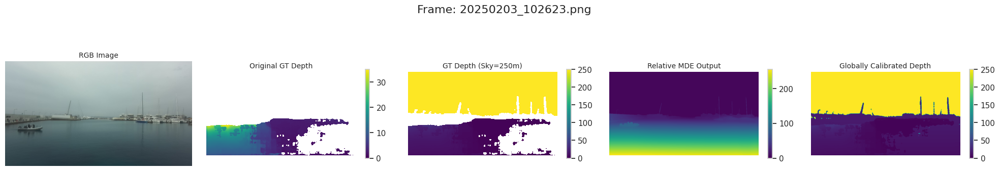

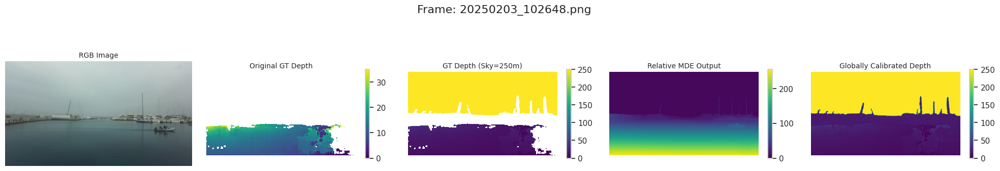


--- PASS 2: Visualizing 2 random frames for South camera ---


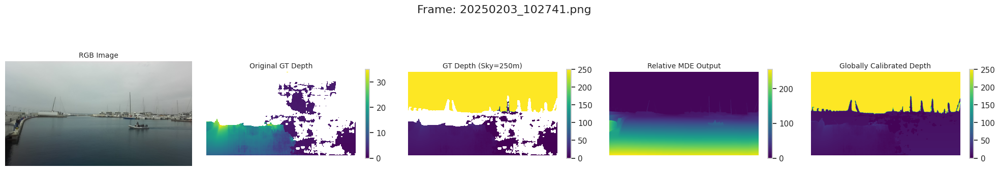

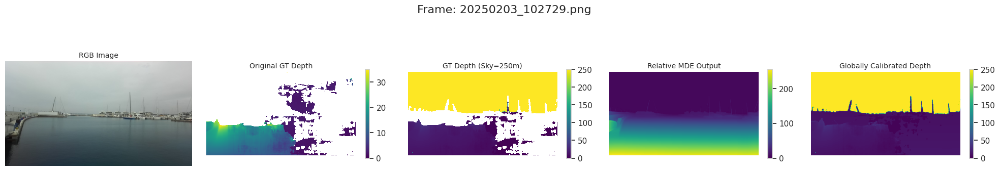

In [12]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
from ultralytics import SAM
from transformers import pipeline
from tqdm import tqdm

# --- 1. CONFIGURATION & INITIALIZATION ---
# Centralize all configuration for easy changes.
DATA_DIR = "/kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data"
CORRECTED_NPY_DIR = "/kaggle/working/corrected_depths"
NUM_CALIBRATION_SAMPLES = 167 # Use all frames for the best calibration
NUM_VISUALIZATION_SAMPLES = 2
SEED = 42

print("Initializing models...")
sam_model = SAM('sam2.1_b.pt')
device = 'cuda' if torch.cuda.is_available() else 'cpu'
depth_pipeline = pipeline('depth-estimation', model="depth-anything/Depth-Anything-V2-Large-hf", device=device)
print(f"Models initialized on device: {device}")

# Set seeds for reproducibility
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# --- 2. HELPER & CORE LOGIC FUNCTIONS ---

def find_sky_mask(masks, image_shape):
    """Robustly finds the most likely sky mask based on size and vertical position."""
    if masks is None or len(masks) == 0:
        return np.zeros(image_shape[:2], dtype=bool)
    image_height = image_shape[0]
    best_sky_mask = np.zeros(image_shape[:2], dtype=bool)
    max_score = -1
    for mask_tensor in masks:
        coords = torch.where(mask_tensor)
        if len(coords[0]) == 0: continue
        centroid_y = torch.mean(coords[0].float())
        if centroid_y < image_height / 1.8: # Prefer top ~55% of the image
            score = torch.sum(mask_tensor) * (1 - (centroid_y / image_height))
            if score > max_score:
                max_score = score
                best_sky_mask = mask_tensor.cpu().numpy().astype(bool)
    return best_sky_mask

def get_global_calibration_factors(camera_name: str):
    """
    PASS 1: Collects data and computes a single global scale and offset for one camera.
    """
    print(f"\n--- PASS 1: Calibrating on {NUM_CALIBRATION_SAMPLES} samples from {camera_name} camera ---")
    dir_rgb = os.path.join(DATA_DIR, camera_name)
    dir_npy = os.path.join(CORRECTED_NPY_DIR, camera_name)
    all_png_files = sorted([f for f in os.listdir(dir_rgb) if f.endswith('.png')])
    sample_files = random.sample(all_png_files, min(NUM_CALIBRATION_SAMPLES, len(all_png_files)))
    
    all_mono_values, all_stereo_values = [], []
    for png_file in tqdm(sample_files, desc=f"Collecting data ({camera_name})"):
        rgb_path = os.path.join(dir_rgb, png_file)
        gt_depth_path = os.path.join(dir_npy, png_file.replace('.png', '.npy'))
        if not os.path.exists(gt_depth_path): continue
        
        stereo_map = np.load(gt_depth_path) / 1000.0
        mono_map = np.array(depth_pipeline(Image.open(rgb_path))["depth"])
        valid_mask = ~np.isnan(stereo_map) & (stereo_map > 2) & (stereo_map < 35)
        
        all_mono_values.append(mono_map[valid_mask])
        all_stereo_values.append(stereo_map[valid_mask])

    global_mono = np.concatenate(all_mono_values)
    global_stereo = np.concatenate(all_stereo_values)
    scale, offset = np.polyfit(global_mono, global_stereo, 1)
    
    print(f"Global Calibration for {camera_name}: Scale={scale:.4f}, Offset={offset:.4f}")
    return scale, offset

def visualize_calibrated_frame(rgb_path, gt_depth_path, global_scale, global_offset):
    """Processes and visualizes a single frame using pre-computed factors."""
    rgb_image = Image.open(rgb_path)
    rgb_array = np.array(rgb_image)
    
    gt_depth_map = np.load(gt_depth_path) / 1000.0
    
    # --- On-the-fly predictions for this single frame ---
    mono_depth_map = np.array(depth_pipeline(rgb_image)["depth"])
    sam_masks = sam_model(rgb_array, verbose=False)[0].masks.data
    sky_mask = find_sky_mask(sam_masks, rgb_array.shape)
    
    # --- Apply calibration and fuse ---
    calibrated_MDE = mono_depth_map * global_scale + global_offset
    valid_stereo_mask = ~np.isnan(gt_depth_map) & (gt_depth_map > 2) & (gt_depth_map < 35)
    final_MDE = np.where(valid_stereo_mask, gt_depth_map, calibrated_MDE)
    final_MDE[sky_mask] = 250.0

    # --- Visualization ---
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    fig.suptitle(f"Frame: {os.path.basename(rgb_path)}", fontsize=16)
    titles = ['RGB Image', 'Original GT Depth', 'GT Depth (Sky=250m)', 'Relative MDE Output', 'Globally Calibrated Depth']
    maps = [rgb_array, gt_depth_map, np.where(sky_mask, 250.0, gt_depth_map), mono_depth_map, final_MDE]
    cmaps = [None, 'viridis', 'viridis', 'viridis', 'viridis']
    vmins = [None, 0, 0, None, 0]
    vmaxs = [None, 35, 250, None, 250]

    for i, ax in enumerate(axes):
        im = ax.imshow(maps[i], cmap=cmaps[i], vmin=vmins[i], vmax=vmaxs[i])
        ax.set_title(titles[i], fontsize=10)
        ax.axis('off')
        if i > 0: fig.colorbar(im, ax=ax, shrink=0.6)
            
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# --- 4. EXECUTION ORCHESTRATOR ---


calibration_factors = {}
for cam in ["North", "South"]:
    calibration_factors[cam] = get_global_calibration_factors(camera_name=cam)


for cam in ["North", "South"]:
    print(f"\n--- PASS 2: Visualizing {NUM_VISUALIZATION_SAMPLES} random frames for {cam} camera ---")
        
    # Get the calibration factors
    g_scale, g_offset = calibration_factors[cam]
        
    # Get a sample of images to visualize
    cam_rgb_dir = os.path.join(DATA_DIR, cam)
    cam_npy_dir = os.path.join(CORRECTED_NPY_DIR, cam)

    all_png_files = [f for f in os.listdir(cam_rgb_dir) if f.endswith('.png')]

    
    if len(all_png_files) < NUM_VISUALIZATION_SAMPLES:
            print(f"Warning: Not enough images to sample {NUM_VISUALIZATION_SAMPLES}. Using all {len(all_png_files)} images.")
            viz_files = all_png_files
    else:
            viz_files = random.sample(all_png_files, NUM_VISUALIZATION_SAMPLES)

    for png_file in viz_files:
        rgb_path = os.path.join(cam_rgb_dir, png_file)
        gt_depth_path = os.path.join(cam_npy_dir, png_file.replace('.png', '.npy'))
            
        if os.path.exists(gt_depth_path):
            visualize_calibrated_frame(rgb_path, gt_depth_path, g_scale, g_offset)

## **Combining with predictions, making final output (jsons)**

In [5]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
from ultralytics import SAM
from transformers import pipeline
from tqdm import tqdm
import supervision as sv
import json
import cv2
import io
import base64

# --- 1. CONFIGURATION & INITIALIZATION ---
DATA_DIR = "/kaggle/input/marina-stereo-vision-vessel-images-full/assignment_data"
CORRECTED_NPY_DIR = "/kaggle/working/corrected_depths"
DETECTIONS_DIR = "/kaggle/working/"
OUTPUT_DIR = "/kaggle/working/final_outputs"

# Create specific output directories for clarity
os.makedirs(os.path.join(OUTPUT_DIR, "depths_npy/North"), exist_ok=True)
os.makedirs(os.path.join(OUTPUT_DIR, "depths_npy/South"), exist_ok=True)

NUM_CALIBRATION_SAMPLES = 167 # Use all frames for the best calibration
MOVIE_FPS = 10
SEED = 42

print("Initializing models...")
sam_model = SAM('sam2.1_b.pt')
device = 'cuda' if torch.cuda.is_available() else 'cpu'
depth_pipeline = pipeline('depth-estimation', model="depth-anything/Depth-Anything-V2-Large-hf", device=device)
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
print(f"Models initialized on device: {device}")

# --- 2. HELPER & CORE LOGIC FUNCTIONS ---

def find_sky_mask(masks, image_shape):
    """Robustly finds the most likely sky mask."""
    if masks is None or len(masks) == 0: return np.zeros(image_shape[:2], dtype=bool)
    image_height, max_score = image_shape[0], -1
    best_sky_mask = np.zeros(image_shape[:2], dtype=bool)
    for mask_tensor in masks:
        coords = torch.where(mask_tensor)
        if len(coords[0]) == 0: continue
        centroid_y = torch.mean(coords[0].float())
        if centroid_y < image_height / 1.8:
            score = torch.sum(mask_tensor) * (1 - (centroid_y / image_height))
            if score > max_score: max_score, best_sky_mask = score, mask_tensor.cpu().numpy().astype(bool)
    return best_sky_mask

def get_global_calibration_factors(camera_name: str):
    """PASS 1: Computes a single global scale and offset for one camera."""
    print(f"\n--- PASS 1: Calibrating on {NUM_CALIBRATION_SAMPLES} samples from {camera_name} camera ---")
    dir_rgb = os.path.join(DATA_DIR, camera_name)
    dir_npy = os.path.join(CORRECTED_NPY_DIR, camera_name)
    all_png_files = sorted([f for f in os.listdir(dir_rgb) if f.endswith('.png')])
    sample_files = random.sample(all_png_files, min(NUM_CALIBRATION_SAMPLES, len(all_png_files)))
    all_mono_values, all_stereo_values = [], []
    for png_file in tqdm(sample_files, desc=f"Collecting data ({camera_name})"):
        rgb_path = os.path.join(dir_rgb, png_file)
        gt_depth_path = os.path.join(dir_npy, png_file.replace('.png', '.npy'))
        if not os.path.exists(gt_depth_path): continue
        stereo_map = np.load(gt_depth_path) / 1000.0
        mono_map = np.array(depth_pipeline(Image.open(rgb_path))["depth"])
        valid_mask = ~np.isnan(stereo_map) & (stereo_map > 2) & (stereo_map < 35)
        all_mono_values.append(mono_map[valid_mask])
        all_stereo_values.append(stereo_map[valid_mask])
    global_mono = np.concatenate(all_mono_values)
    global_stereo = np.concatenate(all_stereo_values)
    scale, offset = np.polyfit(global_mono, global_stereo, 1)
    print(f"Global Calibration for {camera_name}: Scale={scale:.4f}, Offset={offset:.4f}")
    return scale, offset

def load_detections(json_path: str) -> dict:
    """Loads detections and restructures into a timestamp-keyed dictionary."""
    print(f"Loading detections from {json_path}...")
    try:
        with open(json_path, 'r') as f: data = json.load(f)
        return {frame['timestamp']: frame['detections'] for frame in data}
    except Exception as e:
        print(f"Error loading {json_path}: {e}. Returning empty dictionary.")
        return {}

def process_and_annotate_frame(timestamp, camera_name, detections_dict, calib_factors):
    """Processes a single frame, returning annotated images and the raw depth map."""
    rgb_path = os.path.join(DATA_DIR, camera_name, f"{timestamp}.png")
    if not os.path.exists(rgb_path): return None, None, None

    rgb_image = Image.open(rgb_path); rgb_array = np.array(rgb_image)
    g_scale, g_offset = calib_factors

    sam_masks = sam_model(rgb_array, verbose=False)[0].masks.data
    sky_mask = find_sky_mask(sam_masks, rgb_array.shape)
    
    mono_depth_map = np.array(depth_pipeline(rgb_image)["depth"])
    calibrated_depth_map = mono_depth_map * g_scale + g_offset
    
    final_depth_map = calibrated_depth_map
    gt_depth_path = os.path.join(CORRECTED_NPY_DIR, camera_name, f"{timestamp}.npy")
    if os.path.exists(gt_depth_path):
        stereo_depth_map = np.load(gt_depth_path) / 1000.0
        valid_stereo_mask = ~np.isnan(stereo_depth_map) & (stereo_depth_map > 2) & (stereo_depth_map < 35)
        final_depth_map = np.where(valid_stereo_mask, stereo_depth_map, calibrated_depth_map)
    final_depth_map[sky_mask] = 250.0

    frame_detections = detections_dict.get(timestamp, [])
    labels = []
    sv_detections = sv.Detections.empty()
    if frame_detections:
        box_key = 'bbox' if 'bbox' in frame_detections[0] else 'box_2d'
        boxes_xyxy = np.array([det[box_key] for det in frame_detections])
        confs = np.array([det['confidence'] for det in frame_detections])
        sv_detections = sv.Detections(xyxy=boxes_xyxy, confidence=confs)

        for i, box in enumerate(sv_detections.xyxy):
            box_int = box.astype(int)
            depth_in_box = final_depth_map[box_int[1]:box_int[3], box_int[0]:box_int[2]]
            sky_in_box = sky_mask[box_int[1]:box_int[3], box_int[0]:box_int[2]]
            valid_pixels = depth_in_box[~sky_in_box & np.isfinite(depth_in_box) & (depth_in_box > 0.1)]
            dist_str = f"{np.median(valid_pixels):.1f}m" if len(valid_pixels) > 0 else "N/A"
            labels.append(f"{frame_detections[i]['class']} {confs[i]:.2f}\n{dist_str}")

    box_annotator = sv.BoxAnnotator(thickness=2, color_lookup=sv.ColorLookup.INDEX)
    label_annotator = sv.LabelAnnotator(text_scale=0.5, text_padding=4, color_lookup=sv.ColorLookup.INDEX)

    annotated_rgb = label_annotator.annotate(box_annotator.annotate(rgb_array.copy(), sv_detections), sv_detections, labels=labels)
    
    norm_depth = plt.get_cmap('viridis')((final_depth_map / 200).clip(0, 1))
    colored_depth_map = (norm_depth[:, :, :3] * 255).astype(np.uint8)
    annotated_depth = label_annotator.annotate(box_annotator.annotate(colored_depth_map, sv_detections), sv_detections, labels=labels)

    return annotated_rgb, annotated_depth, final_depth_map

# --- 3. EXECUTION ORCHESTRATOR ---
if __name__ == '__main__':
    calibration_factors = {cam: get_global_calibration_factors(cam) for cam in ["North", "South"]}
    north_detections_dict = load_detections(os.path.join(DETECTIONS_DIR, "detections_cam_North.json"))
    south_detections_dict = load_detections(os.path.join(DETECTIONS_DIR, "detections_cam_South.json"))

    all_timestamps = sorted([f.split('.')[0] for f in os.listdir(os.path.join(DATA_DIR, "North")) if f.endswith('.png')])
    
    movie_frames, north_depth_json_output, south_depth_json_output = [], [], []
    frame_size = None

    for timestamp in tqdm(all_timestamps, desc="Processing all frames"):
        north_ann_rgb, north_ann_depth, north_raw_depth = process_and_annotate_frame(timestamp,
                                                                                     "North",
                                                                                     north_detections_dict,
                                                                                     calibration_factors["North"])
        south_ann_rgb, south_ann_depth, south_raw_depth = process_and_annotate_frame(timestamp,
                                                                                     "South",
                                                                                     south_detections_dict,
                                                                                     calibration_factors["South"])
        if north_ann_rgb is None or south_ann_rgb is None: 
            continue

        # --- JSON DATA PREPARATION ---
        for cam, depth_map, json_list in [("North", north_raw_depth, north_depth_json_output), ("South", south_raw_depth, south_depth_json_output)]:
            if depth_map is not None:
                # 1. Ensure data is in a compact type (float16)
                compact_depth_map = depth_map.astype(np.float16)
                
                # 2. Convert the raw bytes of the array to a Base64 string
                encoded_depth = base64.b64encode(compact_depth_map.tobytes()).decode('utf-8')
                
                # 3. Store the encoded string and necessary metadata in the list
                json_list.append({
                    "timestamp": timestamp,
                    "depth_map_shape": compact_depth_map.shape,
                    "dtype": str(compact_depth_map.dtype), # Store the data type for correct decoding
                    "depth_map_base64": encoded_depth
                })

        # --- Create Movie Frame ---
        fig, axes = plt.subplots(2, 2, figsize=(20, 12))
        fig.suptitle(f'Timestamp: {timestamp}', fontsize=16)
        axes[0, 0].imshow(north_ann_rgb)
        axes[0, 0].set_title("North Camera - RGB View")
        axes[0, 0].axis('off')
        axes[0, 1].imshow(south_ann_rgb)
        axes[0, 1].set_title("South Camera - RGB View")
        axes[0, 1].axis('off')
        axes[1, 0].imshow(north_ann_depth)
        axes[1, 0].set_title("North Camera - Depth View")
        axes[1, 0].axis('off')
        axes[1, 1].imshow(south_ann_depth)
        axes[1, 1].set_title("South Camera - Depth View")
        axes[1, 1].axis('off')
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        
        buf = io.BytesIO()
        fig.savefig(buf, format='png', dpi=200)
        buf.seek(0)
        frame_img = np.array(Image.open(buf))[:, :, :3]
        if frame_size is None: 
            frame_size = (frame_img.shape[1], frame_img.shape[0])
        else: 
            frame_img = cv2.resize(frame_img, frame_size)
        movie_frames.append(frame_img)
        plt.close(fig)

    # --- Write Final Output Files ---
    print("\nWriting large depth estimation JSON files with Base64 encoding...")
    for cam, data_list in [("North", north_depth_json_output), ("South", south_depth_json_output)]:
        # Note: No longer creating a separate 'depths_npy' directory
        json_path = os.path.join(OUTPUT_DIR, f"depths_cam_{cam}.json")
        with open(json_path, "w") as f:
            json.dump(data_list, f, indent=2)
        print(f"✔ Saved {len(data_list)} depth frames to {json_path}")

    print("\nWriting final movie file...")
    if movie_frames:
        video_path = os.path.join(OUTPUT_DIR, 'perception_stack_output_10fps.mp4')
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        video_writer = cv2.VideoWriter(video_path, fourcc, MOVIE_FPS, frame_size)
        for frame in tqdm(movie_frames, desc="Encoding video"):
            video_writer.write(cv2.cvtColor(frame, cv2.COLOR_RGB2BGR))
        video_writer.release()
        print(f"✔ Movie saved to {video_path}")

print("\n--- All tasks complete! ---")

Initializing models...


Device set to use cuda


Models initialized on device: cuda

--- PASS 1: Calibrating on 167 samples from North camera ---


Global Calibration for North: Scale=-0.0388, Offset=19.2146

--- PASS 1: Calibrating on 167 samples from South camera ---


Global Calibration for South: Scale=0.0217, Offset=10.1816
Loading detections from /kaggle/working/detections_cam_North.json...
Loading detections from /kaggle/working/detections_cam_South.json...


Processing all frames: 100%|██████████| 167/167 [38:46<00:00, 13.93s/it]



Writing large depth estimation JSON files with Base64 encoding...
✔ Saved 167 depth frames to /kaggle/working/final_outputs/depths_cam_North.json
✔ Saved 167 depth frames to /kaggle/working/final_outputs/depths_cam_South.json

Writing final movie file...


Encoding video: 100%|██████████| 167/167 [00:11<00:00, 14.89it/s]

✔ Movie saved to /kaggle/working/final_outputs/perception_stack_output_10fps.mp4

--- All tasks complete! ---
